# **Préparez des données pour un organisme de santé publique**

In [118]:
pip install numpy pandas scikit-learn

In [119]:
pip install pingouin

# Importation librairie

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import plotly.express as px
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import MissingIndicator, KNNImputer, SimpleImputer, IterativeImputer
from sklearn.linear_model import LinearRegression
import re
import warnings
import os

In [121]:
# Afficher toutes les colonnes
pd.options.display.max_columns = None

# Lecture fichier

In [122]:
import os
print(os.listdir())

['.config', 'data_drift_report_knn.html', 'sweetviz_report_knn.html', 'sweetviz_report_before.html', 'drive', 'sweetviz_report_median.html', 'sample_data']


In [123]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [124]:
# Spécifiez le chemin correct vers votre fichier CSV
file_path = '/content/drive/My Drive/fr.openfoodfacts.org.products.csv'


In [125]:
# Charger le fichier CSV en spécifiant le délimiteur de tabulation, les types de données et en ignorant les lignes problématiques
data = pd.read_csv(file_path, delimiter='\t', on_bad_lines='skip', low_memory=False)


# Exploration des données

## Afficher les 5 premier (data)

In [126]:
data.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN,NaN,NaN,NaN,28 g (1 ONZ),NaN,0.0,[ bananas -> en:bananas ]

*Compter le nombre de produits uniques en utilisant la colonne 'code'*

In [127]:
# Compter le nombre de produits uniques en utilisant la colonne 'code'
nombre_produits_uniques = data['code'].nunique()
print(f"Nombre de produits alimentaires uniques dans la base de données: {nombre_produits_uniques}")

Nombre de produits alimentaires uniques dans la base de données: 320749


*obtenir la taille du fichier*

In [128]:
# Obtenir la taille du fichier en octets
file_size = os.path.getsize(file_path)

# Convertir la taille en Mo
file_size_MB = file_size / (1024 * 1024)
print(f"Taille du fichier CSV: {file_size_MB:.2f} Mo")

Taille du fichier CSV: 808.17 Mo


## Afficher les 5 dernier (data)

In [129]:
data.tail()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
320767,9948282780603,http://world-fr.openfoodfacts.org/produit/9948...,openfoodfacts-contributors,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z,Tomato & ricotta,NaN,1,Plastique,plastique,Panzani,panzani,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:RO,en:romania,Roumanie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,http://world-fr.openfoodfacts.org/produit/9956...,usda-ndb-import,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",NaN,NaN,Plastique,plastique,Trader Joe's,trader-joe-s,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,États-Unis,"Organic peppermint, organic lemon grass, organ...",NaN,NaN,NaN,NaN

## Le nombre de ligne et colonne (data)

In [130]:
data.shape

(320772, 162)

## Le types de variable (data)

In [131]:
data.dtypes

code                        object
url                         object
creator                     object
created_t                   object
created_datetime            object
                            ...   
carbon-footprint_100g      float64
nutrition-score-fr_100g    float64
nutrition-score-uk_100g    float64
glycemic-index_100g        float64
water-hardness_100g        float64
Length: 162, dtype: object

## le nombre duplique (data)

In [132]:
data.duplicated().sum()

0

## le nombre de donnée manquante (data)

In [133]:
data.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

## Proportion de donnée manquante (data)

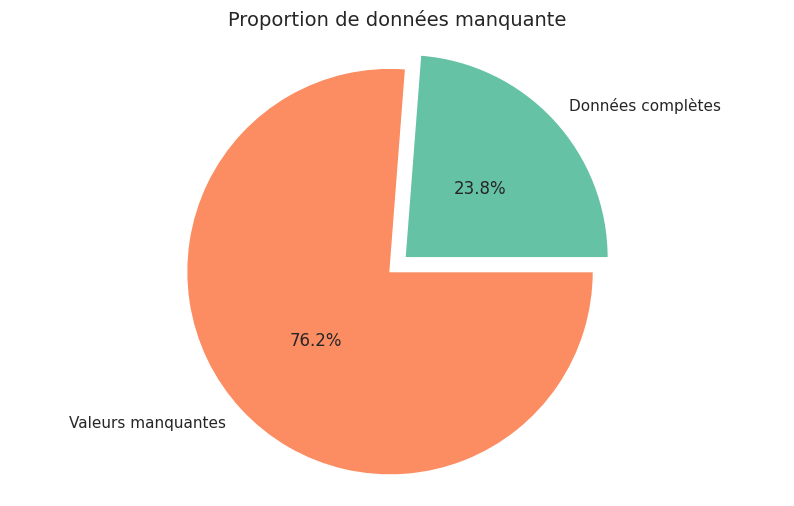

In [134]:
# proportion de donnee manquante
total_manquant = np.prod(data.shape)
valeur_manquant = data.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  # Explosion de la tranche de "Valeurs manquantes"
couleurs = ['#66c2a5', '#fc8d62']  

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs)  
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal")  
plt.show()  

## Taux de donnée manquante (data)

In [135]:
# Calculer le taux de remplissage des colonnes
missing_values = data.isnull().mean() * 100
print(missing_values)

code                         0.007170
url                          0.007170
creator                      0.000623
created_t                    0.000935
created_datetime             0.002806
                              ...    
carbon-footprint_100g       99.916452
nutrition-score-fr_100g     31.038245
nutrition-score-uk_100g     31.038245
glycemic-index_100g        100.000000
water-hardness_100g        100.000000
Length: 162, dtype: float64


## Missingno bar (data)

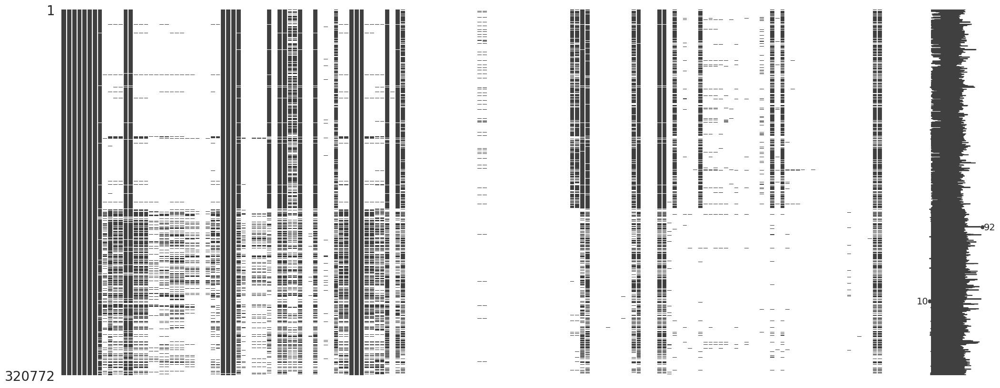

In [136]:
msn.matrix(data)
plt.show()

# Filtrer en fonction des indicateurs pertinents

### Les variables pertinentes choisi:

*   code
*   countries_fr
*   product_name
*   energy_100g
*   salt_100g
*   nutrition_grade_fr_100g
*   nutrition-score-fr_100g
*   proteins_100g
*   carbohydrates_100g
*   sugars_100g
*   saturated-fat_100g
*   fat_100g
*   pnns_groups_1
*   pnns_groups_2

In [137]:
# Colonnes à conserver
columns_to_keep = ['code', 'product_name', 'countries_fr', 'energy_100g',  'salt_100g', 'nutrition_grade_fr', 'nutrition-score-fr_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g', 'saturated-fat_100g', 'fat_100g', 'pnns_groups_1', 'pnns_groups_2']

# Filtrer le dataframe pour ne conserver que les colonnes spécifiques
data_filtre = data[columns_to_keep]

# Afficher les premières lignes du nouveau dataframe
display(data_filtre.head())

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
0,0000000003087,Farine de blé noir,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,NaN,NaN
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,NaN,NaN
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,NaN,NaN
4,0000000016094,Organic Polenta,États-Unis,1552.0,NaN,NaN,NaN,8.57,77.14,NaN,NaN,1.43,NaN,NaN


## Types de data_filtre

In [138]:
data_filtre.dtypes

code                        object
product_name                object
countries_fr                object
energy_100g                float64
salt_100g                  float64
nutrition_grade_fr          object
nutrition-score-fr_100g    float64
proteins_100g              float64
carbohydrates_100g         float64
sugars_100g                float64
saturated-fat_100g         float64
fat_100g                   float64
pnns_groups_1               object
pnns_groups_2               object
dtype: object

## Afficher le nombre de ligne et colonne (data_filtre)

In [139]:
data_filtre.shape

(320772, 14)

## Afficher les duplicata (data_filtre)

In [140]:
data_filtre.duplicated().sum()

5

## Afficher les données manquantes (data_filtre)

In [141]:
data_filtre.isnull().sum()

code                           23
product_name                17762
countries_fr                  280
energy_100g                 59659
salt_100g                   65262
nutrition_grade_fr          99562
nutrition-score-fr_100g     99562
proteins_100g               60850
carbohydrates_100g          77184
sugars_100g                 75801
saturated-fat_100g          91218
fat_100g                    76881
pnns_groups_1              229259
pnns_groups_2              226281
dtype: int64

## Proportion de donnée manquante (data_filtre)

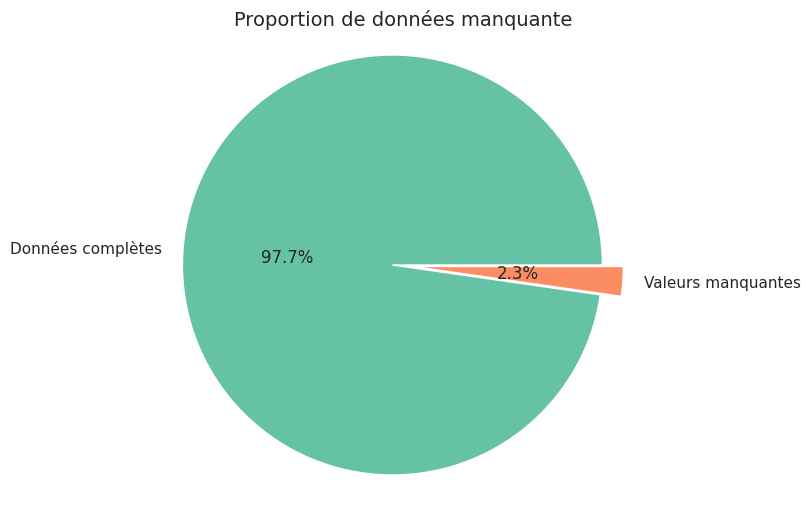

In [142]:
# proportion de donnee manquante
total_manquant = np.prod(data.shape)
valeur_manquant = data_filtre.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  
couleurs = ['#66c2a5', '#fc8d62'] 

# Création du graphique en secteurs
plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs) 
plt.title("Proportion de données manquante", fontsize=14)  
plt.axis("equal")  
plt.show()  

## Pourcentage de donnnée manquante (data_filtre)

In [143]:
# Calculer le taux de remplissage des colonnes
missing_values = data_filtre.isnull().mean() * 100
print(missing_values)

code                        0.007170
product_name                5.537266
countries_fr                0.087289
energy_100g                18.598568
salt_100g                  20.345292
nutrition_grade_fr         31.038245
nutrition-score-fr_100g    31.038245
proteins_100g              18.969860
carbohydrates_100g         24.061951
sugars_100g                23.630803
saturated-fat_100g         28.437021
fat_100g                   23.967491
pnns_groups_1              71.471014
pnns_groups_2              70.542628
dtype: float64


## Selection des pourcentage manquant inferieur a 70 (data_filtre)

In [144]:
# Calculer le taux de remplissage des colonnes
missing_values = data_filtre.isnull().mean() * 100

# Sélectionner les colonnes avec plus de 70% de valeurs manquantes
colonnes_manquantes = missing_values[missing_values < 70]
print(colonnes_manquantes)

code                        0.007170
product_name                5.537266
countries_fr                0.087289
energy_100g                18.598568
salt_100g                  20.345292
nutrition_grade_fr         31.038245
nutrition-score-fr_100g    31.038245
proteins_100g              18.969860
carbohydrates_100g         24.061951
sugars_100g                23.630803
saturated-fat_100g         28.437021
fat_100g                   23.967491
dtype: float64


## Graphe missigno (data_filtre)

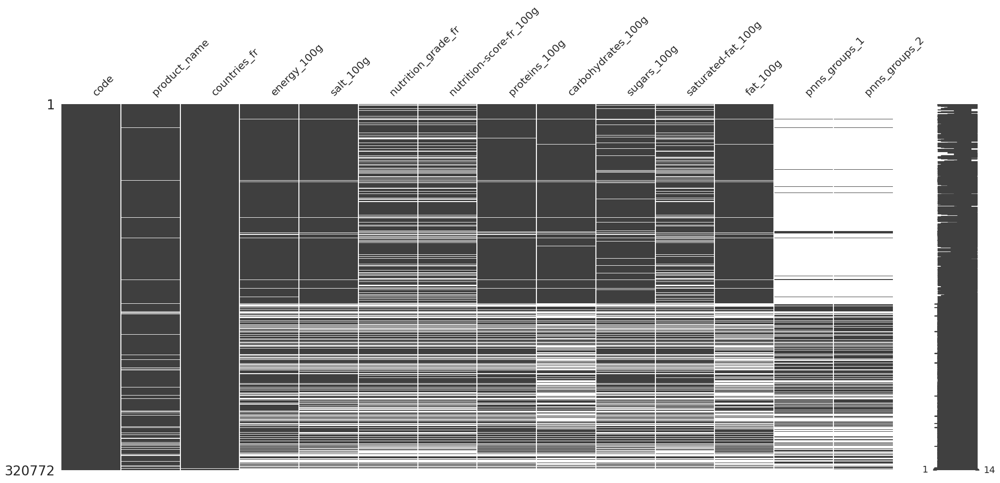

In [145]:
msn.matrix(data_filtre)
plt.show()

## Info sur les variable (data_filtre)

In [146]:
data_filtre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   code                     320749 non-null  object 
 1   product_name             303010 non-null  object 
 2   countries_fr             320492 non-null  object 
 3   energy_100g              261113 non-null  float64
 4   salt_100g                255510 non-null  float64
 5   nutrition_grade_fr       221210 non-null  object 
 6   nutrition-score-fr_100g  221210 non-null  float64
 7   proteins_100g            259922 non-null  float64
 8   carbohydrates_100g       243588 non-null  float64
 9   sugars_100g              244971 non-null  float64
 10  saturated-fat_100g       229554 non-null  float64
 11  fat_100g                 243891 non-null  float64
 12  pnns_groups_1            91513 non-null   object 
 13  pnns_groups_2            94491 non-null   object 
dtypes: f

# Afficher le contenu de chaque variable

## Afficher le contenu de Code (data_filtre)

In [147]:
data_filtre["code"].value_counts()

0000000003087    1
3259011112760    1
3259011134366    1
3259011131822    1
3259011124855    1
                ..
0091037092816    1
0091037092809    1
0091037027122    1
0091037020895    1
999990026839     1
Name: code, Length: 320749, dtype: int64

## afficher le contenu de product_name (data_filtre)

<Axes: >

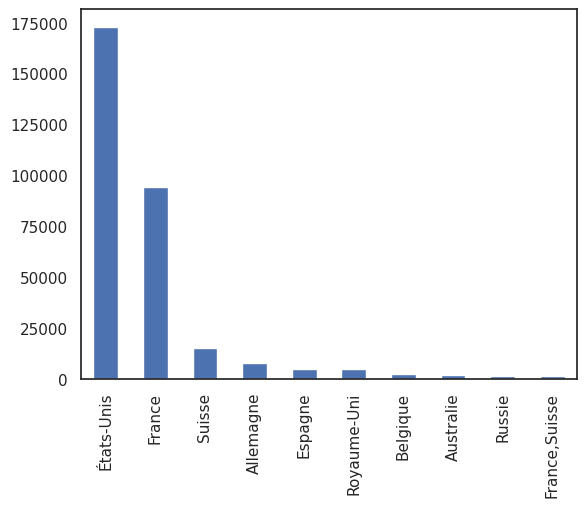

In [148]:
data_filtre['countries_fr'].value_counts().head(10).plot.bar()

## afficher le contenu energy_100g (data_filtre)

<Axes: ylabel='Frequency'>

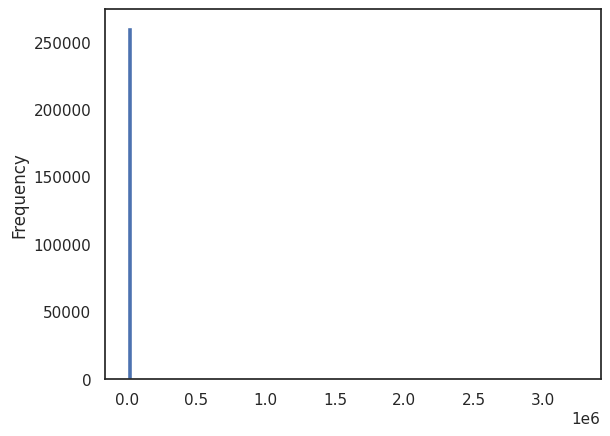

In [149]:
data_filtre["energy_100g"].plot.hist(bins=100)

## Afficher le contenu de salt_100g (data_filtre)

<Axes: ylabel='Frequency'>

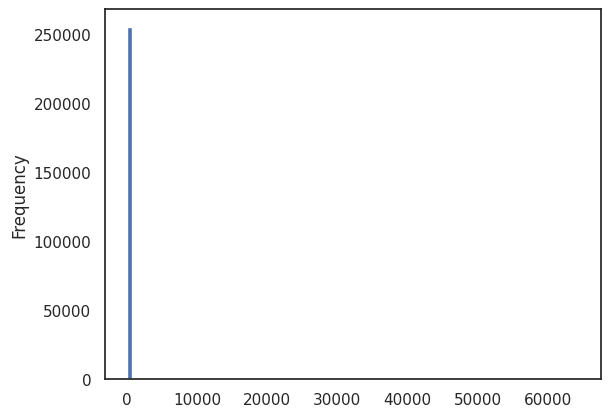

In [150]:
data_filtre["salt_100g"].plot.hist(bins=100)

<Axes: >

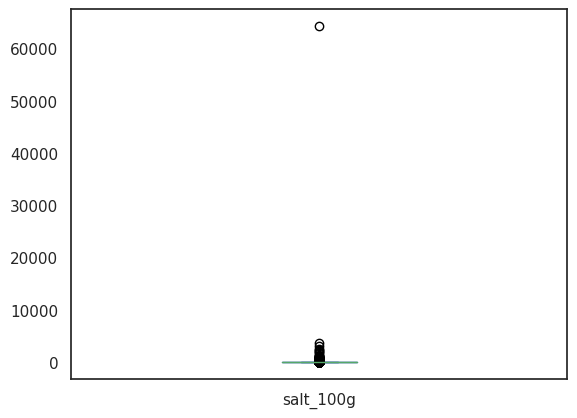

In [151]:
data_filtre["salt_100g"].plot.box()

## Afficher le contenu nutrition_grade_fr (data_filtre)

<Axes: >

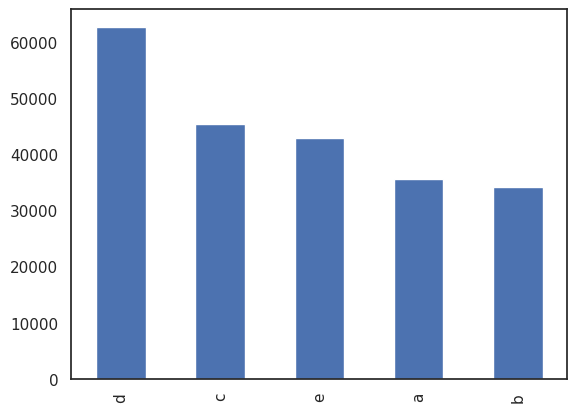

In [152]:
data_filtre['nutrition_grade_fr'].value_counts().head(10).plot.bar()

## Afficher le contenu nutrition-score-fr_100g (data_filtre)





<Axes: ylabel='Frequency'>

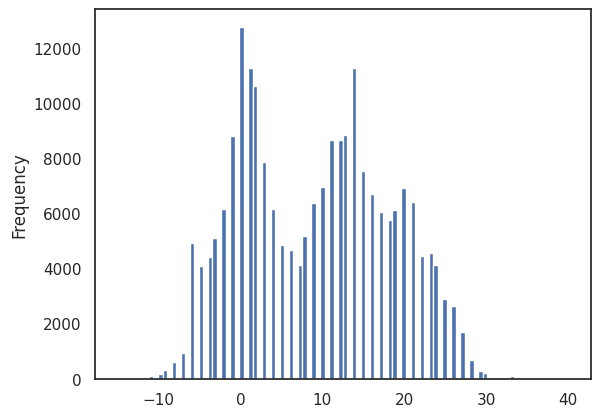

In [153]:
data_filtre["nutrition-score-fr_100g"].plot.hist(bins=100)

## Afficher le contenu proteins_100g (data_filtre)

<Axes: ylabel='Frequency'>

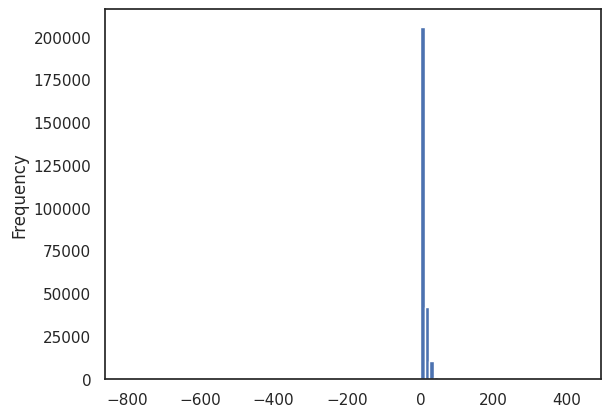

In [154]:
data_filtre["proteins_100g"].plot.hist(bins=100)

## Afficher le contenu de carbohydrates_100g

<Axes: ylabel='Frequency'>

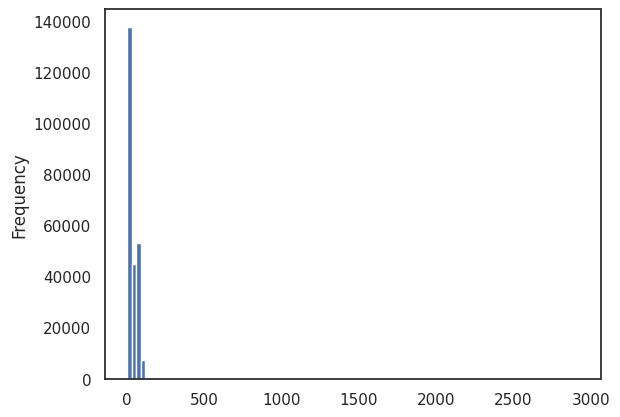

In [155]:
data_filtre["carbohydrates_100g"].plot.hist(bins=100)

## Afficher le contenu desugars_100g  

<Axes: ylabel='Frequency'>

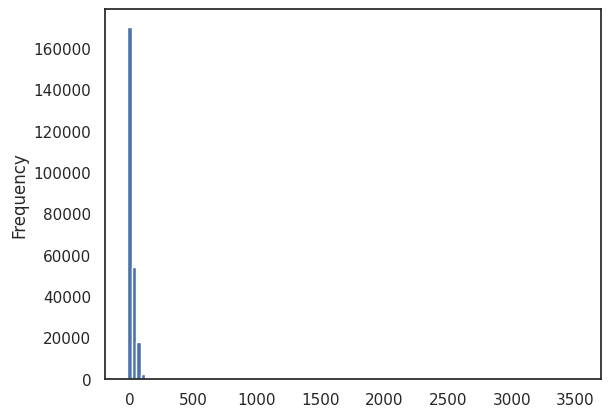

In [156]:
data_filtre["sugars_100g"].plot.hist(bins=100)

## Afficher le contenu fat_100g (data_filtre)

<Axes: ylabel='Frequency'>

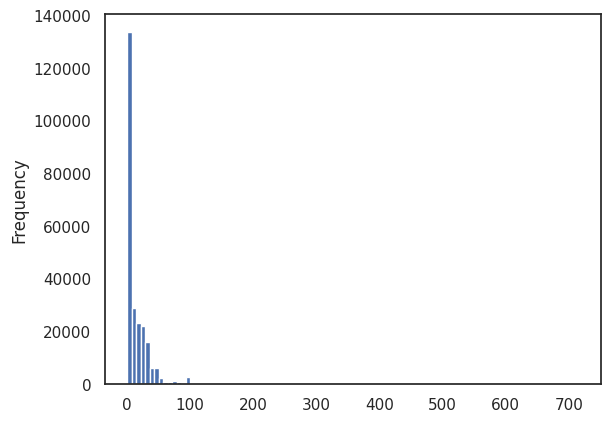

In [157]:
data_filtre["fat_100g"].plot.hist(bins=100)

## Afficher le contenu pnns_groups_1 (data_filtre)

<Axes: >

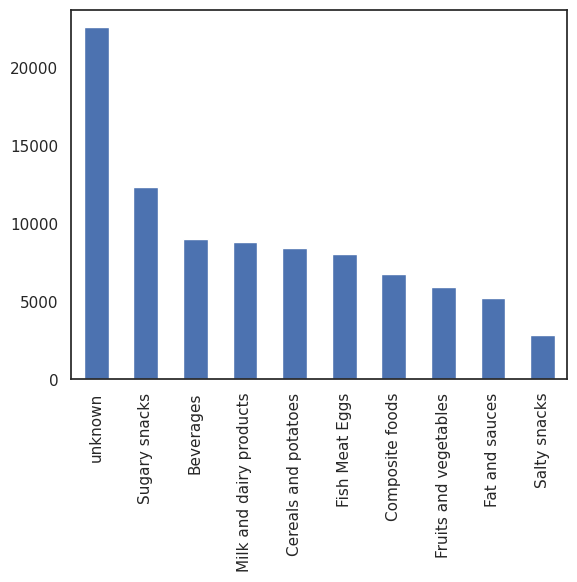

In [158]:
data_filtre['pnns_groups_1'].value_counts().head(10).plot.bar()

## Afficher le contenu pnns_groups_2 (data_filtre)

<Axes: >

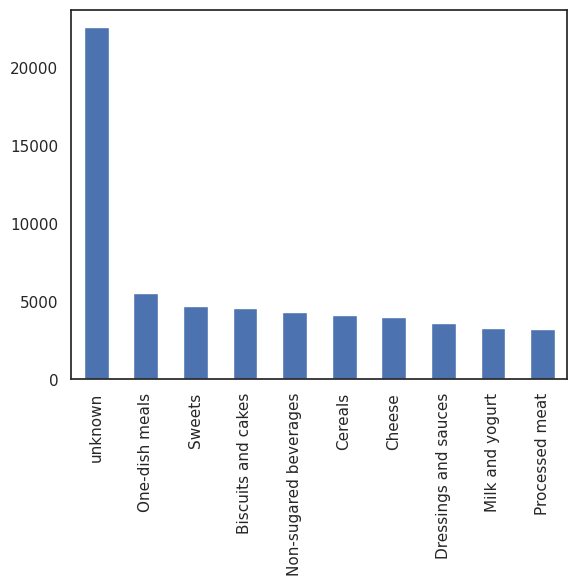

In [159]:
data_filtre['pnns_groups_2'].value_counts().head(10).plot.bar()

# Netoyage de data_filtre

## Suprimer les lignes et colonnes entierement NaN (data_filtre)
Dans un premier temps nous allons suprimer les lignes et colonne remplis par NaN

In [160]:
# Suppression des colonnes entièrement vides
data_filtre = data_filtre.dropna(axis=1, how='all')

# Suppression des lignes entièrement vides
data_filtre = data_filtre.dropna(axis=0, how='all')
data_filtre

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
0,0000000003087,Farine de blé noir,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,NaN,NaN
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,NaN,NaN
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,NaN,NaN
4,0000000016094,Organic Polenta,États-Unis,1552.0,NaN,NaN,NaN,8.57,77.14,NaN,NaN,1.43,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,Tomato & ricotta,Roumanie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",États-Unis,0.0,0.00000,b,0.0,0.00,0.00,0.00,0.00,0.00,NaN,NaN
320769,9970229501521,乐吧泡菜味薯片,Chine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Salty snacks,Appetizers
320770,9980282863788,Tomates aux Vermicelles,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## filtrer les produit en provenance de la France (data_filtre)

In [161]:
france_data = data_filtre[data_filtre['countries_fr'] == 'France']
display(france_data.head())

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
0,0000000003087,Farine de blé noir,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,0000000024600,Filet de bœuf,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown
48,0000000027205,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
136,0000000039259,Twix x2,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown
182,0000005200016,lentilles vertes,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cereals and potatoes,Legumes


## Duplicata (data_filtre)

#### Afficher les doublons (data_filtre)

In [162]:
# Trouver toutes les lignes dupliquées
duplicates = data_filtre[data_filtre.duplicated(keep=False)]

display(duplicates)

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
189162,NaN,France,en:fruit-yogurts,NaN,NaN,NaN,NaN,0.158,NaN,NaN,NaN,NaN,NaN,NaN
189168,NaN,France,en:stirred-yogurts,NaN,NaN,NaN,NaN,0.120,NaN,NaN,NaN,NaN,NaN,NaN
189242,NaN,France,en:whole-milk-yogurts,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
189244,NaN,France,en:whole-milk-yogurts,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
189248,NaN,France,en:stirred-yogurts,NaN,NaN,NaN,NaN,0.120,NaN,NaN,NaN,NaN,NaN,NaN
189345,NaN,France,en:stirred-yogurts,NaN,NaN,NaN,NaN,0.120,NaN,NaN,NaN,NaN,NaN,NaN
189362,NaN,France,en:yogurts,NaN,NaN,NaN,NaN,0.180,NaN,NaN,NaN,NaN,NaN,NaN
189364,NaN,France,en:yogurts,NaN,NaN,NaN,NaN,0.180,NaN,NaN,NaN,NaN,NaN,NaN
189417,NaN,France,en:fruit-yogurts,NaN,NaN,NaN,NaN,0.158,NaN,NaN,NaN,NaN,NaN,NaN


## Supprimer les doublons en gardant les premières occurrences (data_filtre)

In [163]:
data_filtre = data_filtre.drop_duplicates()
display(data_filtre)

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
0,0000000003087,Farine de blé noir,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,NaN,NaN
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,NaN,NaN
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,NaN,NaN
4,0000000016094,Organic Polenta,États-Unis,1552.0,NaN,NaN,NaN,8.57,77.14,NaN,NaN,1.43,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,Tomato & ricotta,Roumanie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",États-Unis,0.0,0.00000,b,0.0,0.00,0.00,0.00,0.00,0.00,NaN,NaN
320769,9970229501521,乐吧泡菜味薯片,Chine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Salty snacks,Appetizers
320770,9980282863788,Tomates aux Vermicelles,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Suprimer toute les ligne ayant plus de 12 données manquante (data_filtre)

In [164]:
# Définir le seuil à 12 données non manquantes
data_filtre = data_filtre.dropna(thresh=len(data_filtre.columns) - 12)

# Afficher le DataFrame filtré
display(data_filtre)

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
0,0000000003087,Farine de blé noir,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,NaN,NaN
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,NaN,NaN
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,NaN,NaN
4,0000000016094,Organic Polenta,États-Unis,1552.0,NaN,NaN,NaN,8.57,77.14,NaN,NaN,1.43,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320767,9948282780603,Tomato & ricotta,Roumanie,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320768,99567453,"Mint Melange Tea A Blend Of Peppermint, Lemon ...",États-Unis,0.0,0.00000,b,0.0,0.00,0.00,0.00,0.00,0.00,NaN,NaN
320769,9970229501521,乐吧泡菜味薯片,Chine,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Salty snacks,Appetizers
320770,9980282863788,Tomates aux Vermicelles,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## suprimer les lignes dont nutrition_grade_fr est NaN (data_filtre)

Etant donner que nous avons choisi nutrition_grade_fr comme cible dans ce cas on peut eventuelement suprimer les ligne de nutrition_grade_fr qui ne sont pas remplie.

In [165]:
# Supprimer les lignes où 'nutrition_grade_fr'et countries_fr est NaN
data_filtre = data_filtre.dropna(subset=['nutrition_grade_fr', 'countries_fr', 'product_name'])
data_filtre

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,NaN,NaN
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,NaN,NaN
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,NaN,NaN
7,0000000016124,Organic Muesli,États-Unis,1833.0,0.13970,c,7.0,14.06,57.81,15.62,4.69,18.75,NaN,NaN
12,0000000016872,Zen Party Mix,États-Unis,2230.0,1.60782,d,12.0,16.67,36.67,3.33,5.00,36.67,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320742,9787461062105,Natural Cassava,États-Unis,1477.0,0.03048,a,-1.0,1.18,87.06,2.35,0.00,0.00,NaN,NaN
320751,9847548283004,Tartines craquantes bio au sarrasin,France,1643.0,0.68000,a,-4.0,13.00,74.80,2.60,0.60,2.80,Cereals and potatoes,Bread
320757,9900000000233,Amandes,France,2406.0,0.10000,b,0.0,21.22,NaN,3.89,3.73,NaN,NaN,NaN
320763,99111250,Thé vert Earl grey,France,21.0,0.02540,c,2.0,0.50,0.50,0.50,0.20,0.20,Beverages,Non-sugared beverages


## Remplacer 'unknown' par NaN dans les colonnes 'pnns_groups_1' et 'pnns_groups_2' (data_filtre)

In [166]:
# Remplacement de 'unknown' par NaN dans les colonnes 'pnns_groups_1' et 'pnns_groups_2'
data_filtre.loc[:, ['pnns_groups_1', 'pnns_groups_2']] = data_filtre.loc[:, ['pnns_groups_1', 'pnns_groups_2']].replace('unknown', np.nan)

<ipython-input-166-aad7a3aee42e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtre.loc[:, ['pnns_groups_1', 'pnns_groups_2']] = data_filtre.loc[:, ['pnns_groups_1', 'pnns_groups_2']].replace('unknown', np.nan)


In [167]:
data_filtre.describe()

,energy_100g,salt_100g,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g
count,2.182240e+05,218224.000000,218410.000000,218224.000000,200933.000000,218224.000000,218224.000000,200961.000000
mean,1.195353e+03,1.646430,9.151751,7.778581,33.250147,15.003871,4.954202,13.336660
std,7.032119e+03,138.292289,9.052644,8.131458,28.342326,21.191607,7.649800,16.192181
min,0.000000e+00,0.000000,-15.000000,-3.570000,0.000000,-17.860000,0.000000,0.000000
25%,4.520000e+02,0.100000,1.000000,1.900000,7.000000,1.280000,0.000000,0.833000
50%,1.193000e+03,0.650000,10.000000,5.700000,24.000000,5.000000,1.790000,7.140000
75%,1.715000e+03,1.361440,16.000000,10.710000,59.090000,23.000000,7.140000,21.430000
max,3.251373e+06,64312.800000,40.000000,430.000000,209.380000,3520.000000,550.000000,714.290000


## Traitement es valeurs manquante et aberrantes

### Afficher les valeurs aberrantes

In [168]:
# Définir la fonction pour trouver les valeurs aberrantes
def box_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    mask = (series < Q1 - 1.5 * IQR) | (series > Q3 + 1.5 * IQR)
    outliers = series[mask]
    # Trier les valeurs aberrantes par ordre décroissant
    outliers = outliers.sort_values(ascending=False)
    return outliers

# Appliquer la fonction aux colonnes numériques du DataFrame
numeric_columns = data_filtre.select_dtypes(include=['float64', 'int64']).columns

for column in numeric_columns:
    outliers = box_outliers(data_filtre[column])
    print(f'Outliers for {column}:')
    print(outliers)
    print()



    # Accéder aux valeurs aberrantes dans le DataFrame d'origine
    outliers_indices = outliers.index
    outliers_df = data_filtre.loc[outliers_indices]
    display(f'Outliers DataFrame for {column}:')
    display(outliers_df)
    display()

Outliers for energy_100g:
212928    3251373.0
313506     231199.0
249101     182764.0
112681     110579.0
176697      22000.0
            ...    
243090       3619.0
165072       3615.0
279935       3615.0
165073       3615.0
165071       3615.0
Name: energy_100g, Length: 717, dtype: float64



'Outliers DataFrame for energy_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
212928,3257983143096,Pois cassés,France,3251373.0,0.01000,b,0.0,22.7,48.2,2.5,0.20,1.20,NaN,NaN
313506,8710573641501,"Nusco, Chocolate Spread, Chocolate",États-Unis,231199.0,0.01016,e,25.0,430.0,NaN,3520.0,550.00,NaN,NaN,NaN
249101,3661405001053,"Légume Noisettes Carottes, 500 Grammes, Marque...",France,182764.0,1.19000,d,12.0,4.0,21.0,4.5,2.00,9.00,NaN,NaN
112681,0201203040026,Premium Extra Virgin Olive Oil,États-Unis,110579.0,0.00000,e,20.0,0.0,NaN,0.0,100.00,714.29,NaN,NaN
176697,2000000045489,bubbly,en:السعودية,22000.0,0.27940,e,29.0,8.9,56.5,54.0,18.00,29.50,Sugary snacks,Chocolate products
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243090,3564700789025,Tuiles apéritives Tokapi Poulet braisé,France,3619.0,3.20000,e,20.0,6.5,NaN,6.5,4.30,NaN,NaN,NaN
165072,0857320002081,"Coconut Oil, Pre-Measured Spreadable Baking St...",États-Unis,3615.0,0.00000,e,20.0,0.0,0.0,0.0,92.86,100.00,NaN,NaN
279935,5419980014634,Pates A Tartiner,France,3615.0,1.60000,e,31.0,11.5,NaN,69.8,65.90,NaN,NaN,NaN
165073,0857320002128,"Kelapo, Extra Virgin Coconut Oil",États-Unis,3615.0,0.00000,e,20.0,0.0,0.0,0.0,92.86,100.00,NaN,NaN


Outliers for salt_100g:
145844    64312.80000
139595     3048.00000
105006     2452.41318
23590      2032.00000
58007      1799.16582
             ...     
83162         3.25374
73160         3.25374
65758         3.25374
92704         3.25374
84570         3.25374
Name: salt_100g, Length: 11719, dtype: float64



'Outliers DataFrame for salt_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
145844,0786754430200,Prickly Syrup,États-Unis,1218.0,64312.80000,e,23.0,0.00,72.15,53.16,0.00,0.00,NaN,NaN
139595,0743724349702,Sauce & Marinade,États-Unis,280.0,3048.00000,d,11.0,0.00,13.33,6.67,0.00,0.00,NaN,NaN
105006,0086492908079,Bastoncini Whole Wheat,États-Unis,1586.0,2452.41318,c,10.0,10.34,75.86,3.45,1.72,5.17,NaN,NaN
23590,0028239217006,Original Barbecue Sauce,États-Unis,628.0,2032.00000,c,10.0,0.00,36.67,16.67,0.00,0.00,NaN,NaN
58007,0046100007013,String Cheese Snacks,États-Unis,1222.0,1799.16582,e,23.0,25.00,4.17,0.00,12.50,18.75,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83162,0073214001279,Hot Cauliflower,États-Unis,67.0,3.25374,c,10.0,0.00,3.12,0.00,0.00,0.00,NaN,NaN
73160,0070844570519,Pad Thai Sauce,États-Unis,590.0,3.25374,d,18.0,0.00,34.38,34.38,0.00,0.00,NaN,NaN
65758,0054500193540,"Park's Finest, Beef Frankfurters, Slow Cooked ...",États-Unis,1322.0,3.25374,e,23.0,12.28,7.02,1.75,10.53,26.32,NaN,NaN
92704,0076963534135,Giardiniera Pickled Mixed Vegetable,États-Unis,67.0,3.25374,c,10.0,0.00,3.12,3.12,0.00,0.00,NaN,NaN


Outliers for nutrition-score-fr_100g:
55851     40.0
55852     40.0
55878     40.0
177065    40.0
Name: nutrition-score-fr_100g, dtype: float64



'Outliers DataFrame for nutrition-score-fr_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
55851,0043000013083,"Maxwell House, Creme Cappuccino",États-Unis,4184.0,3.33248,e,40.0,37.50,75.00,75.00,37.50,56.25,NaN,NaN
55852,0043000013090,Cafe Collection Coffee & Milk Creamer,États-Unis,4707.0,3.96748,e,40.0,50.00,87.50,75.00,43.75,75.00,NaN,NaN
55878,0043000032893,Coffee & Milk Creamer,États-Unis,5577.0,6.35000,e,40.0,66.67,66.67,66.67,58.33,100.00,NaN,NaN
177065,20009373,Cappuccino allégé en sucre*,France,1603.0,3.25000,e,40.0,9.50,51.30,34.90,13.40,14.60,Beverages,Non-sugared beverages


Outliers for proteins_100g:
313506    430.00
127525    100.00
150075    100.00
170118    100.00
285429    100.00
           ...  
105079     23.94
81759      23.94
81760      23.94
142543     23.94
137432     23.93
Name: proteins_100g, Length: 11377, dtype: float64



'Outliers DataFrame for proteins_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
313506,8710573641501,"Nusco, Chocolate Spread, Chocolate",États-Unis,231199.0,0.01016,e,25.0,430.00,NaN,3520.00,550.00,NaN,NaN,NaN
127525,0698502500571,Savarez - Jeu De Cordes,France,4.0,0.00000,a,-10.0,100.00,NaN,0.10,0.10,NaN,NaN,NaN
150075,0812603011556,Tcho-A-Day Dark Chocolate,États-Unis,2301.0,0.00000,e,24.0,100.00,55.00,40.00,22.50,35.00,NaN,NaN
170118,0883929140886,Harry Potter & The Deathly Hallows Radcliffe /...,France,4.0,0.00000,a,-10.0,100.00,NaN,0.00,0.00,NaN,NaN,NaN
285429,7340055304214,Marshall - Major Noir,France,21.0,50.00000,c,10.0,100.00,NaN,5.00,5.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105079,0086600240114,Premium Albacore Tuna In Water,États-Unis,473.0,0.64516,a,-2.0,23.94,0.00,0.00,0.70,2.82,NaN,NaN
81759,0072745002229,"Short Cuts, Southwestern Style Carved Chicken ...",États-Unis,531.0,1.64592,c,3.0,23.94,2.82,1.41,0.70,2.82,NaN,NaN
81760,0072745002243,"Short Cuts, Carved Chicken Breast, Honey Roasted",États-Unis,531.0,1.57480,b,2.0,23.94,2.82,2.82,0.70,2.82,NaN,NaN
142543,0759283600154,Vegan Veggie Burgers,États-Unis,531.0,1.14554,a,-4.0,23.94,9.86,1.41,0.00,1.41,NaN,NaN


Outliers for carbohydrates_100g:
71000     209.38
245311    190.00
317635    139.00
Name: carbohydrates_100g, dtype: float64



'Outliers DataFrame for carbohydrates_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
71000,0070552801110,"Toaster Pastries, Strawberry",États-Unis,2615.0,1.50876,e,25.0,6.25,209.38,46.88,6.25,NaN,NaN,NaN
245311,3596710288755,mini choux goût fromage de chèvre - poivre,France,18700.0,9.33000,e,35.0,0.00,190.00,22.70,210.00,380.0,Salty snacks,Appetizers
317635,8935000901649,Banane sèche,France,1259.0,0.00000,c,4.0,5.00,139.00,41.50,0.00,0.0,Fruits and vegetables,Dried fruits


Outliers for sugars_100g:
313506    3520.0
111566     134.0
202571     104.0
260611     103.5
260599     103.5
           ...  
178148      55.6
268592      55.6
206726      55.6
111394      55.6
271455      55.6
Name: sugars_100g, Length: 12689, dtype: float64



'Outliers DataFrame for sugars_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
313506,8710573641501,"Nusco, Chocolate Spread, Chocolate",États-Unis,231199.0,0.01016,e,25.0,430.00,NaN,3520.0,550.000,NaN,NaN,NaN
111566,01364008,Tomato Ketchup,États-Unis,2510.0,0.01060,d,17.0,7.06,136.0,134.0,0.588,0.588,Fat and sauces,Dressings and sauces
202571,3229820787909,Sirop d'Agave brun bio,France,1760.0,0.14000,d,15.0,0.00,104.0,104.0,0.000,0.000,NaN,NaN
260611,4016249696122,Agavendicksaft,Allemagne,1760.0,0.10000,d,15.0,1.00,103.5,103.5,0.100,1.000,NaN,NaN
260599,4016249015732,Sirop d agave pur,France,1760.0,0.10000,d,15.0,1.00,103.5,103.5,0.100,1.000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178148,20136307,Brasilia,France,2253.0,0.14000,e,26.0,5.40,58.1,55.6,21.000,31.000,Sugary snacks,Biscuits and cakes
268592,4901104850231,海鮮風味拉麵,Taiwan,1974.0,0.53086,e,26.0,10.90,57.8,55.6,9.900,21.900,NaN,NaN
206726,3250391426348,Chocolat Blanc Éclats de Spéculoos,France,2307.0,0.31000,e,27.0,6.10,61.1,55.6,19.500,31.400,Sugary snacks,Chocolate products
111394,01188936,Thick Cut Orange Marmalade,France,1092.0,0.13000,d,11.0,0.50,NaN,55.6,0.100,NaN,NaN,NaN


Outliers for saturated-fat_100g:
313506    550.00
245311    210.00
177219    100.00
112681    100.00
163203    100.00
           ...  
109853     17.86
109852     17.86
109851     17.86
109783     17.86
154043     17.86
Name: saturated-fat_100g, Length: 15887, dtype: float64



'Outliers DataFrame for saturated-fat_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
313506,8710573641501,"Nusco, Chocolate Spread, Chocolate",États-Unis,231199.0,0.01016,e,25.0,430.00,NaN,3520.00,550.00,NaN,NaN,NaN
245311,3596710288755,mini choux goût fromage de chèvre - poivre,France,18700.0,9.33000,e,35.0,0.00,190.00,22.70,210.00,380.00,Salty snacks,Appetizers
177219,20022082,Frites & Fritures,France,3700.0,0.00000,e,20.0,0.00,0.00,0.00,100.00,100.00,Fat and sauces,Fats
112681,0201203040026,Premium Extra Virgin Olive Oil,États-Unis,110579.0,0.00000,e,20.0,0.00,NaN,0.00,100.00,714.29,NaN,NaN
163203,0855522004186,"St. Jamaica, Coconut Oil",États-Unis,4184.0,0.00000,e,20.0,0.00,0.00,0.00,100.00,100.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109853,0099482412449,Swiss Cheese,États-Unis,1644.0,0.54356,d,16.0,32.14,3.57,0.00,17.86,28.57,NaN,NaN
109852,0099482412432,Colby Jack Cheese,États-Unis,1644.0,1.63322,e,21.0,25.00,3.57,0.00,17.86,32.14,NaN,NaN
109851,0099482412425,Monterey Jack Cheese,États-Unis,1494.0,1.54178,e,20.0,21.43,3.57,0.00,17.86,28.57,NaN,NaN
109783,0099482403614,Shredded Mild Cheddar Cheese,États-Unis,1644.0,1.63322,e,21.0,25.00,3.57,0.00,17.86,32.14,NaN,NaN


Outliers for fat_100g:
112681    714.29
245311    380.00
305054    105.00
303101    101.00
306836    100.00
           ...  
34777      52.38
61712      52.38
10085      52.38
60433      52.38
167707     52.38
Name: fat_100g, Length: 5355, dtype: float64



'Outliers DataFrame for fat_100g:'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
112681,0201203040026,Premium Extra Virgin Olive Oil,États-Unis,110579.0,0.00000,e,20.0,0.00,NaN,0.00,100.00,714.29,NaN,NaN
245311,3596710288755,mini choux goût fromage de chèvre - poivre,France,18700.0,9.33000,e,35.0,0.00,190.00,22.70,210.00,380.00,Salty snacks,Appetizers
305054,8032942610032,Graine de couscous moyen,France,1482.0,0.01000,a,-1.0,12.00,70.00,2.50,0.30,105.00,Cereals and potatoes,Cereals
303101,8005305900255,Ekstra Jomfru Olivenolie,Danemark,3737.0,0.00000,d,11.0,0.00,0.00,0.00,15.00,101.00,Fat and sauces,Fats
306836,8410179004686,Huile d'olive vierge extra,France,3700.0,0.00000,d,12.0,0.00,0.00,0.00,16.00,100.00,Fat and sauces,Fats
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34777,0037600234757,Singles Creamy Peanut Butter,États-Unis,2690.0,1.39192,e,21.0,21.43,19.05,9.52,10.71,52.38,NaN,NaN
61712,0050428487136,Party Peanuts,États-Unis,2489.0,1.02870,d,15.0,28.57,14.29,4.76,8.33,52.38,NaN,NaN
10085,0011822584616,Roasted Peanuts,États-Unis,2489.0,1.02870,d,15.0,28.57,14.29,4.76,8.33,52.38,NaN,NaN
60433,0049022880559,Mixed Nuts,États-Unis,2489.0,1.02870,d,14.0,21.43,19.05,4.76,7.14,52.38,NaN,NaN


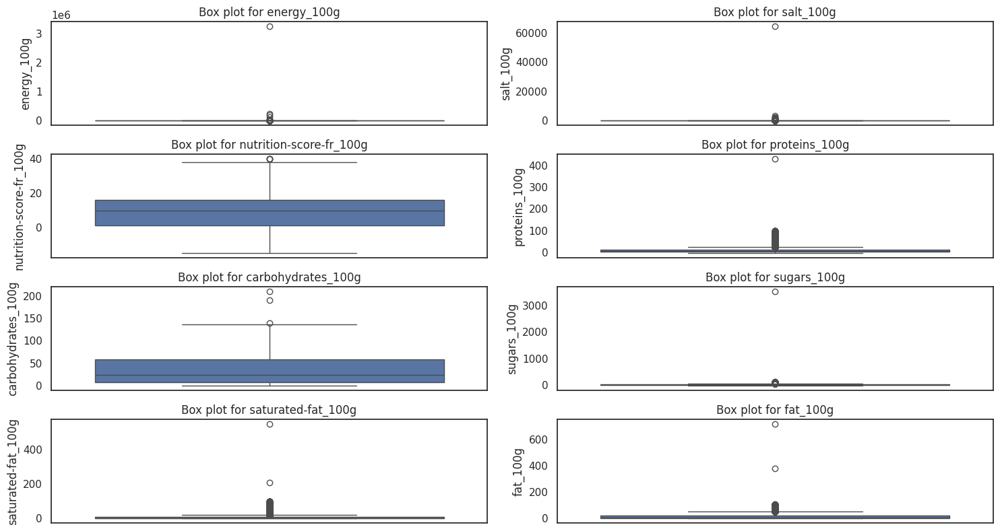

In [169]:
# Définir la fonction pour trouver les valeurs aberrantes
def box_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    mask = (series < Q1 - 1.5 * IQR) | (series > Q3 + 1.5 * IQR)
    series = series[mask]
    return series

# Sélectionner les colonnes numériques du DataFrame
numeric_columns = data_filtre.select_dtypes(include=['float64', 'int64']).columns

# Créer des box plots pour chaque colonne numérique
plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(len(numeric_columns) // 2 + 1, 2, i)
    sns.boxplot(data=data_filtre[column])
    plt.title(f'Box plot for {column}')
plt.tight_layout()
plt.show()

### Traitement automatique des valeurs aberantes et NaN (data_filtre)
 1) Trier le dataframe en fonction du salt_100g, nutitions-score_100g, sugars_100g, carbohydrates_100g, proteins_100g, saturated_100g, energy_100g, fat_100g par ordre decroissant et garder que les valeurs inferieur a 100g

2) filtrer en fonction de energy_100g avec des valeur inferieur à 3800

3) Imputation des valeurs numériques manquantes avec la médiane

4) Imputation des valeurs catégorielles manquantes avec le mode (valeur la plus fréquente)

### Graphique avant et apres imputation

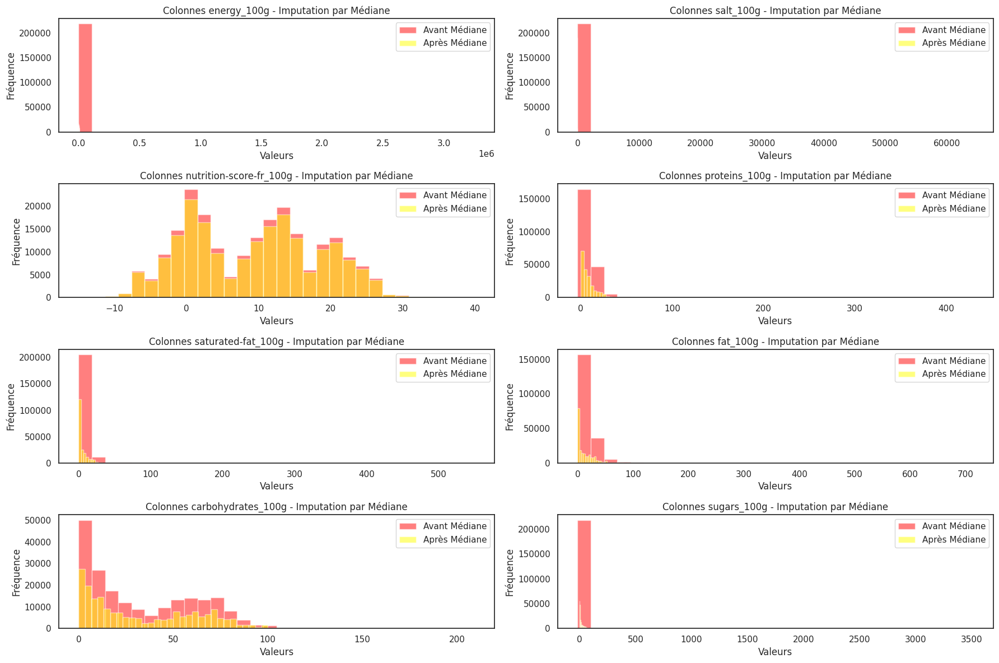

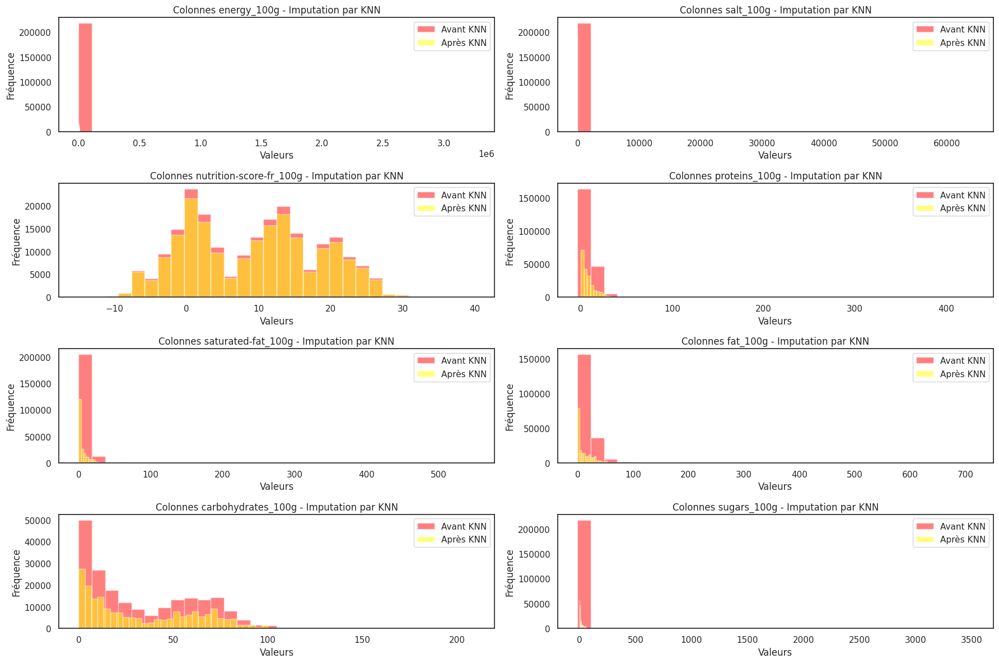

In [170]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer


# Copie du DataFrame original
filtered_data_median = data_filtre.copy()
filtered_data_knn = data_filtre.copy()

# Liste des colonnes numériques pour l'imputation
numerical_cols = ['energy_100g', 'salt_100g', 'nutrition-score-fr_100g', 'proteins_100g', 'saturated-fat_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g']

# 1. Filtrage automatique selon les critères spécifiés
filtered_data_median = filtered_data_median[
    (filtered_data_median['salt_100g'] <= 100) &
    (filtered_data_median['nutrition-score-fr_100g'] <= 100) &
    (filtered_data_median['carbohydrates_100g'] <= 100) &
    (filtered_data_median['sugars_100g'] <= 100) &
    (filtered_data_median['energy_100g'] <= 3800) &
    (filtered_data_median['proteins_100g'] <= 100) &
    (filtered_data_median['saturated-fat_100g'] <= 100) &
    (filtered_data_median['fat_100g'] <= 100)
].copy()

filtered_data_knn = filtered_data_knn[
    (filtered_data_knn['salt_100g'] <= 100) &
    (filtered_data_knn['nutrition-score-fr_100g'] <= 100) &
    (filtered_data_knn['carbohydrates_100g'] <= 100) &
    (filtered_data_knn['sugars_100g'] <= 100) &
    (filtered_data_knn['energy_100g'] <= 3800) &
    (filtered_data_knn['proteins_100g'] <= 100) &
    (filtered_data_knn['saturated-fat_100g'] <= 100) &
    (filtered_data_knn['fat_100g'] <= 100)
].copy()

# 2. Imputation des valeurs numériques manquantes avec médiane pour filtered_data_median
median_values = filtered_data_median[numerical_cols].median()
filtered_data_median.loc[:, numerical_cols] = filtered_data_median.loc[:, numerical_cols].fillna(median_values)

# 3. Imputation des valeurs numériques manquantes avec KNN pour filtered_data_knn
imputer = KNNImputer(n_neighbors=5)
filtered_data_knn[numerical_cols] = imputer.fit_transform(filtered_data_knn[numerical_cols])

# Tracé des histogrammes
plt.figure(figsize=(18, 12))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 2, i + 1)

    # Avant imputation par médiane
    plt.hist(data_filtre[col].dropna(), bins=30, color='red', alpha=0.5, label='Avant Médiane')

    # Après imputation par médiane
    plt.hist(filtered_data_median[col], bins=30, color='yellow', alpha=0.5, label='Après Médiane')

    plt.title(f'Colonnes {col} - Imputation par Médiane')
    plt.xlabel('Valeurs')
    plt.ylabel('Fréquence')
    plt.legend()

plt.tight_layout()
plt.show()

plt.figure(figsize=(18, 12))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 2, i + 1)

    # Avant imputation par KNN
    plt.hist(data_filtre[col].dropna(), bins=30, color='red', alpha=0.5, label='Avant KNN')

    # Après imputation par KNN
    plt.hist(filtered_data_knn[col], bins=30, color='yellow', alpha=0.5, label='Après KNN')

    plt.title(f'Colonnes {col} - Imputation par KNN')
    plt.xlabel('Valeurs')
    plt.ylabel('Fréquence')
    plt.legend()

plt.tight_layout()
plt.show()

### Imputation KNN

In [171]:
from sklearn.impute import KNNImputer

filtered_data_knn = data_filtre.copy()

# 1. Filtrage automatique selon les critères spécifiés
filtered_data_knn = filtered_data_knn[
    (filtered_data_knn['salt_100g'] <= 100) &
    (filtered_data_knn['nutrition-score-fr_100g'] <= 100) &
    (filtered_data_knn['carbohydrates_100g'] <= 100) &
    (filtered_data_knn['sugars_100g'] <= 100) &
    (filtered_data_knn['energy_100g'] <= 3800) &
    (filtered_data_knn['proteins_100g'] <= 100) &
    (filtered_data_knn['saturated-fat_100g'] <= 100) &
    (filtered_data_knn['fat_100g'] <= 100)
].copy() 

# 2. Imputation des valeurs numériques manquantes avec KNN
numerical_cols = ['energy_100g', 'salt_100g', 'nutrition-score-fr_100g', 'proteins_100g', 'saturated-fat_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g']

# Initialiser l'imputeur KNN avec k voisins
imputer = KNNImputer(n_neighbors=2)

# Appliquer l'imputeur KNN sur les colonnes numériques
filtered_data_knn[numerical_cols] = imputer.fit_transform(filtered_data_knn[numerical_cols])

# 3. Imputation des valeurs catégorielles manquantes avec le mode (valeur la plus fréquente)
filtered_data_knn['pnns_groups_1'].fillna(filtered_data_knn['pnns_groups_1'].mode()[0], inplace=True)
filtered_data_knn['pnns_groups_2'].fillna(filtered_data_knn['pnns_groups_2'].mode()[0], inplace=True)

display("Données après imputation par KNN :")
display(filtered_data_knn)

'Données après imputation par KNN :'

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,Sugary snacks,One-dish meals
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,Sugary snacks,One-dish meals
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,Sugary snacks,One-dish meals
7,0000000016124,Organic Muesli,États-Unis,1833.0,0.13970,c,7.0,14.06,57.81,15.62,4.69,18.75,Sugary snacks,One-dish meals
12,0000000016872,Zen Party Mix,États-Unis,2230.0,1.60782,d,12.0,16.67,36.67,3.33,5.00,36.67,Sugary snacks,One-dish meals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320738,9780803738782,Organic Z Bar,États-Unis,1393.0,0.95250,d,11.0,5.56,61.11,30.56,2.78,9.72,Sugary snacks,One-dish meals
320742,9787461062105,Natural Cassava,États-Unis,1477.0,0.03048,a,-1.0,1.18,87.06,2.35,0.00,0.00,Sugary snacks,One-dish meals
320751,9847548283004,Tartines craquantes bio au sarrasin,France,1643.0,0.68000,a,-4.0,13.00,74.80,2.60,0.60,2.80,Cereals and potatoes,Bread
320763,99111250,Thé vert Earl grey,France,21.0,0.02540,c,2.0,0.50,0.50,0.50,0.20,0.20,Beverages,Non-sugared beverages


### Imputation Mediane

In [172]:

filtered_data = data_filtre.copy()

filtered_data = filtered_data[
    (filtered_data['salt_100g'] <= 100) &
    (filtered_data['nutrition-score-fr_100g'] <= 100) &
    (filtered_data['carbohydrates_100g'] <= 100) &
    (filtered_data['sugars_100g'] <= 100) &
    (filtered_data['energy_100g'] <= 3800) &
    (filtered_data['proteins_100g'] <= 100) &
    (filtered_data['saturated-fat_100g'] <= 100) &
    (filtered_data['fat_100g'] <= 100)
].copy() 

#  Imputation des valeurs numériques manquantes avec la médiane
numerical_cols = ['energy_100g', 'salt_100g', 'nutrition-score-fr_100g', 'proteins_100g', 'saturated-fat_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g']
median_values = filtered_data[numerical_cols].median()
filtered_data.loc[:, numerical_cols] = filtered_data.loc[:, numerical_cols].fillna(median_values)

# Imputation des valeurs catégorielles manquantes avec le mode (valeur la plus fréquente)
filtered_data['pnns_groups_1'].fillna(filtered_data['pnns_groups_1'].mode()[0], inplace=True)
filtered_data['pnns_groups_2'].fillna(filtered_data['pnns_groups_2'].mode()[0], inplace=True)


display(filtered_data)

,code,product_name,countries_fr,energy_100g,salt_100g,nutrition_grade_fr,nutrition-score-fr_100g,proteins_100g,carbohydrates_100g,sugars_100g,saturated-fat_100g,fat_100g,pnns_groups_1,pnns_groups_2
1,0000000004530,Banana Chips Sweetened (Whole),États-Unis,2243.0,0.00000,d,14.0,3.57,64.29,14.29,28.57,28.57,Sugary snacks,One-dish meals
2,0000000004559,Peanuts,États-Unis,1941.0,0.63500,b,0.0,17.86,60.71,17.86,0.00,17.86,Sugary snacks,One-dish meals
3,0000000016087,Organic Salted Nut Mix,États-Unis,2540.0,1.22428,d,12.0,17.86,17.86,3.57,5.36,57.14,Sugary snacks,One-dish meals
7,0000000016124,Organic Muesli,États-Unis,1833.0,0.13970,c,7.0,14.06,57.81,15.62,4.69,18.75,Sugary snacks,One-dish meals
12,0000000016872,Zen Party Mix,États-Unis,2230.0,1.60782,d,12.0,16.67,36.67,3.33,5.00,36.67,Sugary snacks,One-dish meals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320738,9780803738782,Organic Z Bar,États-Unis,1393.0,0.95250,d,11.0,5.56,61.11,30.56,2.78,9.72,Sugary snacks,One-dish meals
320742,9787461062105,Natural Cassava,États-Unis,1477.0,0.03048,a,-1.0,1.18,87.06,2.35,0.00,0.00,Sugary snacks,One-dish meals
320751,9847548283004,Tartines craquantes bio au sarrasin,France,1643.0,0.68000,a,-4.0,13.00,74.80,2.60,0.60,2.80,Cereals and potatoes,Bread
320763,99111250,Thé vert Earl grey,France,21.0,0.02540,c,2.0,0.50,0.50,0.50,0.20,0.20,Beverages,Non-sugared beverages


### comparaison après les imputations

## proportion des données manquante après netoyage (data_filtre)

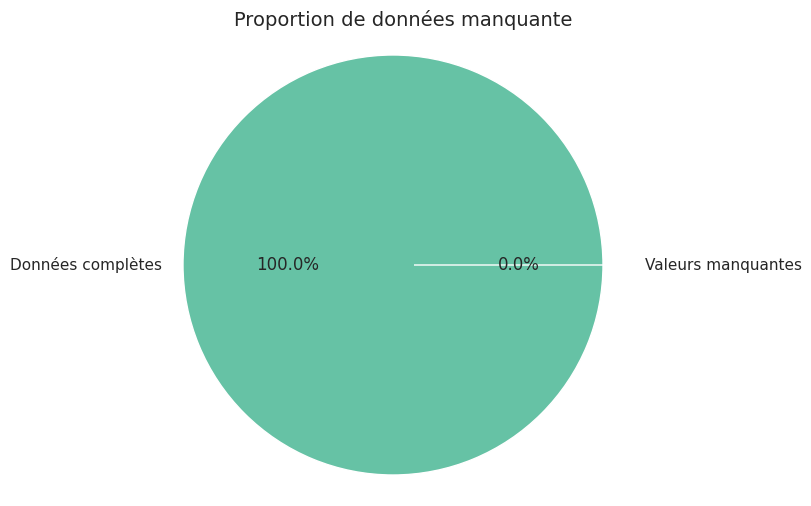

In [173]:
# proportion de donnee manquante
total_manquant = np.prod(data_filtre.shape)
valeur_manquant = filtered_data.isna().sum().sum()
labels = ["Données complètes", "Valeurs manquantes"]
vals = [total_manquant - valeur_manquant, valeur_manquant]
explose = (0, 0.1)  
couleurs = ['#66c2a5', '#fc8d62']  

plt.figure(figsize=[10, 6])  
plt.pie(x=vals, labels=labels, explode=explose, autopct="%.1f%%", pctdistance=0.5, colors=couleurs) 
plt.title("Proportion de données manquante", fontsize=14) 
plt.axis("equal") 
plt.show() 

## Pourcentage des valeurs manquantes apres traitement automatisé

In [174]:
# Calculer le taux de remplissage des colonnes
missing_values = filtered_data.isnull().mean() * 100
print(missing_values)

code                       0.0
product_name               0.0
countries_fr               0.0
energy_100g                0.0
salt_100g                  0.0
nutrition_grade_fr         0.0
nutrition-score-fr_100g    0.0
proteins_100g              0.0
carbohydrates_100g         0.0
sugars_100g                0.0
saturated-fat_100g         0.0
fat_100g                   0.0
pnns_groups_1              0.0
pnns_groups_2              0.0
dtype: float64


## Graphique en bar des données manquantes apres traitement automatisé

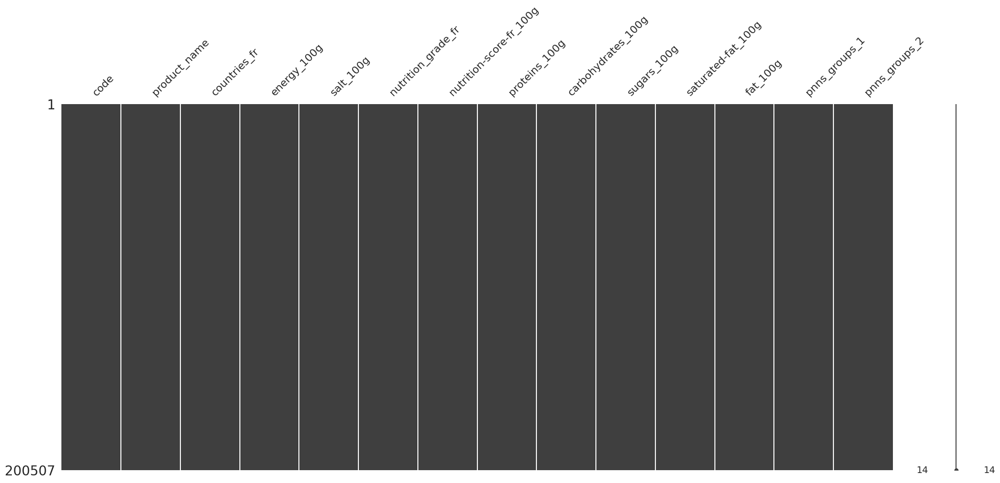

In [175]:
msn.matrix(filtered_data)
plt.show()

# Analyse Univariées

### Boucle pour afficher toute les analyses bivariées

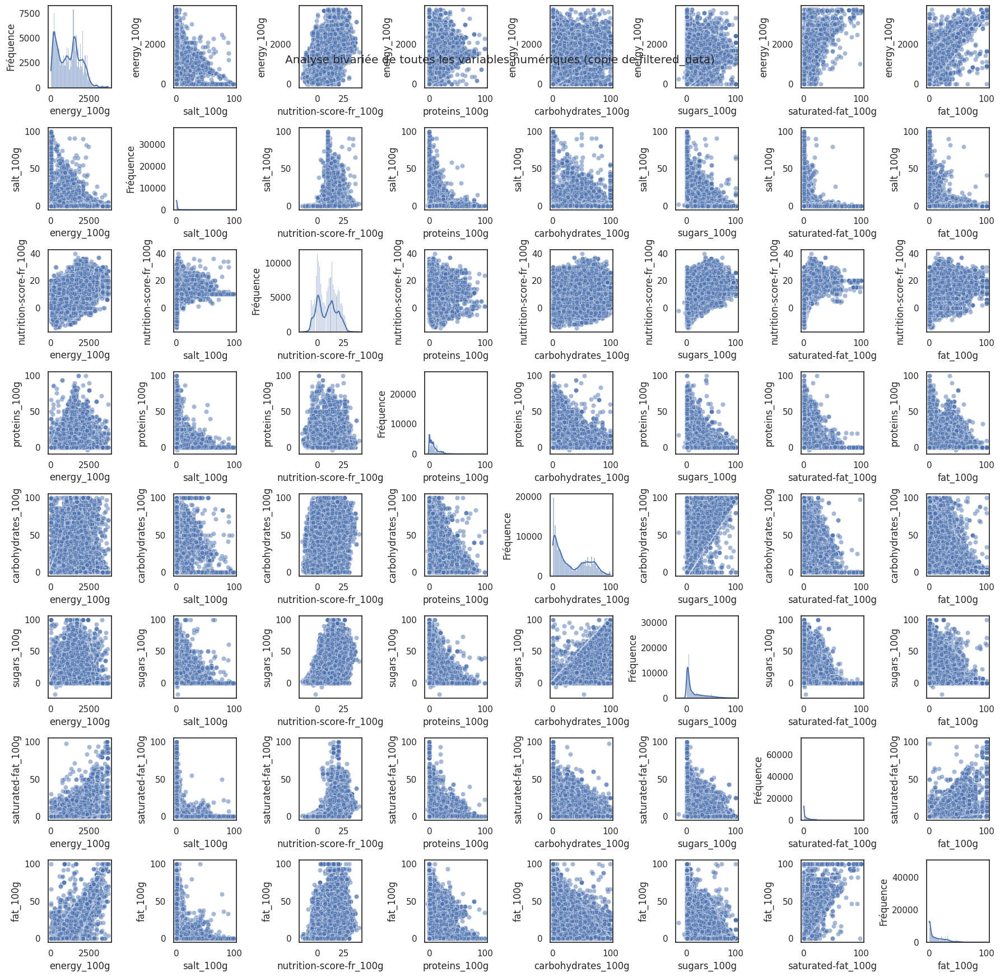

In [176]:
# Faire une copie de filtered_data
filtered_data_copy = filtered_data.copy()

# Définir le style de seaborn pour améliorer l'apparence des tracés
sns.set(style="white")

# Sélectionner les colonnes numériques à analyser
numerical_cols = filtered_data_copy.select_dtypes(include='number').columns

# Créer une matrice de graphiques pour chaque paire de variables
plt.figure(figsize=(18, 18))
for i, col1 in enumerate(numerical_cols):
    for j, col2 in enumerate(numerical_cols):
        plt.subplot(len(numerical_cols), len(numerical_cols), i * len(numerical_cols) + j + 1)

        if i == j:
            # Tracer un histogramme sur la diagonale principale
            sns.histplot(filtered_data_copy[col1].dropna(), kde=True)
            plt.xlabel(col1)
            plt.ylabel('Fréquence')
        else:
            # Tracer un scatter plot pour les paires de variables différentes
            sns.scatterplot(x=filtered_data_copy[col2], y=filtered_data_copy[col1], alpha=0.5)
            plt.xlabel(col2)
            plt.ylabel(col1)

plt.suptitle('Analyse bivariée de toutes les variables numériques (copie de filtered_data)', y=0.92)
plt.tight_layout()
plt.show()

## analyse univariée de nutrition-score-fr_100g

In [177]:
filtered_data['nutrition-score-fr_100g'].describe()

count    200507.000000
mean          9.142599
std           9.056833
min         -15.000000
25%           1.000000
50%          10.000000
75%          16.000000
max          40.000000
Name: nutrition-score-fr_100g, dtype: float64

### Distribution statistique empirique nutrition-score-fr_100g

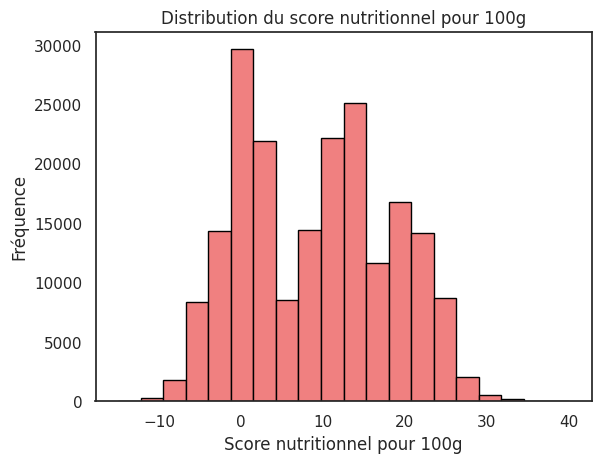

In [178]:
plt.hist(filtered_data['nutrition-score-fr_100g'], bins=20, color='lightcoral', edgecolor='black')
plt.xlabel('Score nutritionnel pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution du score nutritionnel pour 100g')
plt.show()

### Diagramme en en bar de nutrition-score-fr_100g
* Le score nutritionnel de 0.0 est le plus fréquent le jeu de données, représentant environ 6% des échantillons.
* Les scores 1.0 et 14.0 suivent avec une fréquence légèrement inférieure à 6%.
* Les autres valeurs sont moins fréquentes, avec des fréquences décroissantes.

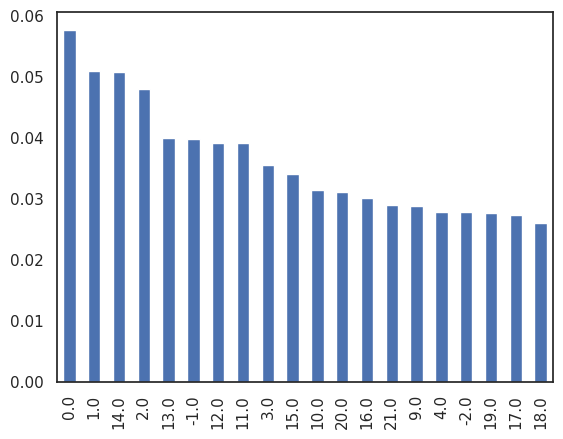

In [179]:
# Obtenez les 100 premiers éléments des valeurs normalisées
top_100 = data['nutrition-score-fr_100g'].value_counts(normalize=True).head(20)

# Tracez le diagramme en tuyaux d'orgues (bar plot)
top_100.plot(kind='bar')

plt.show()

### Box-plot de Score nutritionnel pour 100g

Text(0.5, 1.0, 'Boxplot du score nutritionnel pour 100g')

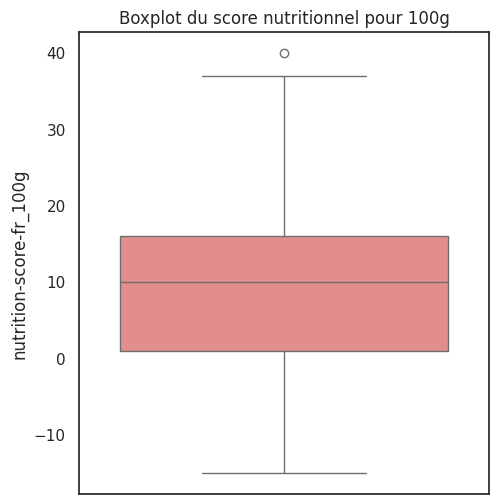

In [180]:

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 3)
sns.boxplot(data=filtered_data, y='nutrition-score-fr_100g', color='lightcoral')
plt.title('Boxplot du score nutritionnel pour 100g')

## Effectuons les test de Normalité

### Test de Shapiro-Wilk

In [181]:
from scipy.stats import kstest, norm, shapiro
# Test de Shapiro-Wilk
statistic_shapiro, p_value_shapiro = shapiro(filtered_data['nutrition-score-fr_100g'])
print('Statistique de test Shapiro-Wilk:', statistic_shapiro)
print('p-value:', p_value_shapiro)

if p_value_shapiro > 0.05:
    print("Les données suivent une distribution normale (ne rejetez pas H0)")
else:
    print("Les données ne suivent pas une distribution normale (rejetez H0)")

Statistique de test Shapiro-Wilk: 0.9692173600196838
p-value: 0.0
Les données ne suivent pas une distribution normale (rejetez H0)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


On constate que la taille de l'échantillon dépasse 5000, les tests de normalité comme le test de Shapiro-Wilk peuvent devenir moins fiables et le message d'avertissement nous informe que la p-value peut ne pas être précise. Dans ce cas, il est recommandé d'utiliser d'autres tests ou méthodes pour vérifier la normalité, comme le test de Kolmogorov-Smirnov ou l'analyse visuelle des Q-Q plots et des histogrammes.

### Test de Kolmogorov-Smirnov

In [182]:
#le test de Kolmogorov-Smirnov

from scipy.stats import kstest, norm
# Standardiser les données
data_standardized = (filtered_data['nutrition-score-fr_100g'] - np.mean(data_filtre['nutrition-score-fr_100g'])) / np.std(filtered_data['nutrition-score-fr_100g'])

# Test de Kolmogorov-Smirnov
d, p_value_ks = kstest(data_standardized, 'norm')
print('Statistique de test Kolmogorov-Smirnov:', d)
print('p-value:', p_value_ks)

if p_value_ks > 0.05:
    print("Les données suivent une distribution normale (ne rejetez pas H0)")
else:
    print("Les données ne suivent pas une distribution normale (rejetez H0)")

Statistique de test Kolmogorov-Smirnov: 0.10516071177929126
p-value: 0.0
Les données ne suivent pas une distribution normale (rejetez H0)


Le résultat du test de Kolmogorov-Smirnov indique que les données ne suivent pas une distribution normale, car la p-value est inférieure à 0.05. Cela signifie que nous rejetons l'hypothèse nulle (H0) selon laquelle les données sont normalement distribuées.

### Test Agostino-Pearson

In [183]:
# le test de normalité de D'Agostino-Pearson (ou test K2 de D'Agostino)
from scipy.stats import normaltest

def d_agostino_test(dataframe, feature):
    """Perform D'Agostino-Pearson's test for normality on a specific column in a pd.DataFrame."""

    # Extracting the column data
    column_data = dataframe[feature].dropna()  # Drop NaN values if any

    # Performing D'Agostino-Pearson's test
    stat, p_value = normaltest(column_data)

    # Displaying the test result
    print(f"Statistique de test D'Agostino-Pearson : {stat}")
    print(f"p-value : {p_value}")

    # Interpretation based on p-value
    alpha = 0.05
    if p_value > alpha:
        print("Les données suivent une distribution normale (ne rejetez pas H0)")
    else:
        print("Les données ne suivent pas une distribution normale (rejetez H0)")

feature = 'nutrition-score-fr_100g'
d_agostino_test(data_filtre, feature)

Statistique de test D'Agostino-Pearson : 56112.903113497465
p-value : 0.0
Les données ne suivent pas une distribution normale (rejetez H0)


Le résultat du test de D'Agostino-Pearson que nous avez effectué montre une statistique de test élevée (6297.36) et un p-value très faible (0.0). Cela conduit à rejeter l'hypothèse nulle (H0) selon laquelle les données suivent une distribution normale. En d'autres termes, les données dans la colonne 'nutrition-score-fr_100g' de votre DataFrame data_filtre ne suivent pas une distribution normale.

### Test Anova

In [184]:

# Comparaison des protéines par 100g ('proteins_100g') entre les groupes définis par 'nutrition_grade_fr'
import pingouin as pg

# Comparison of proteins per 100g ('proteins_100g') between groups defined by 'nutrition_grade_fr'
aov_custom = pg.anova(data=filtered_data, dv='proteins_100g', between='nutrition_grade_fr', detailed=True)

# Display the results
print(aov_custom)

               Source            SS      DF            MS            F  p-unc  \
0  nutrition_grade_fr  3.737632e+05       4  93440.801984  1509.740746    0.0   
1              Within  1.240946e+07  200502     61.891952          NaN    NaN   

        np2  
0  0.029239  
1       NaN  


Test anova, hypothèse: les moyennes sont egales dans les differentes categories

on constate que p-unc=0.0 ce qui est < 0.05 on rejete l'hypothese, ce qui signifie que les moyennes sont significativement differentes.

   np2  
0  0.029239, est eta carré, compris entre 0 et 1, c'est un peu comme le coef correlation

pour faire ce test on a besoin de 2 conditions:
1. la normalité et distribution (comme on a verifier au debut donc c'est pas possible)
2. egalité des variance a l'interieur de chaque de distribution

### Test Kruskal

In [185]:

# Comparaison des protéines par 100g ('proteins_100g') entre les groupes définis par 'nutrition_grade_fr'
import pingouin as pg

# Comparison of proteins per 100g ('proteins_100g') between groups defined by 'nutrition_grade_fr'
aov_custom = pg.kruskal(data=filtered_data, dv='proteins_100g', between='nutrition_grade_fr', detailed=True)

print(aov_custom)

                     Source  ddof1            H  p-unc
Kruskal  nutrition_grade_fr      4  7726.501879    0.0


cette fois si c'est l'hypothese egalité des medianes.

 comme p-unc est 0.0 on rejete l'hypothese, les medianes sont significativement diferentes

## Distribution empirique du nutrition grade

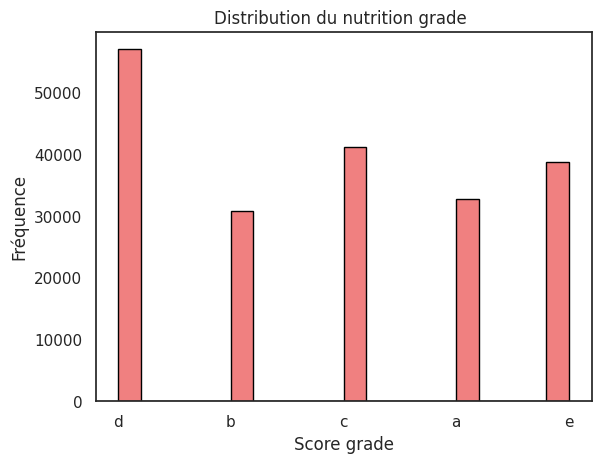

In [186]:
plt.hist(filtered_data['nutrition_grade_fr'], bins=20, color='lightcoral', edgecolor='black')
plt.xlabel('Score grade')
plt.ylabel('Fréquence')
plt.title('Distribution du nutrition grade ')
plt.show()

## Distribution statistique empirique energy_100g

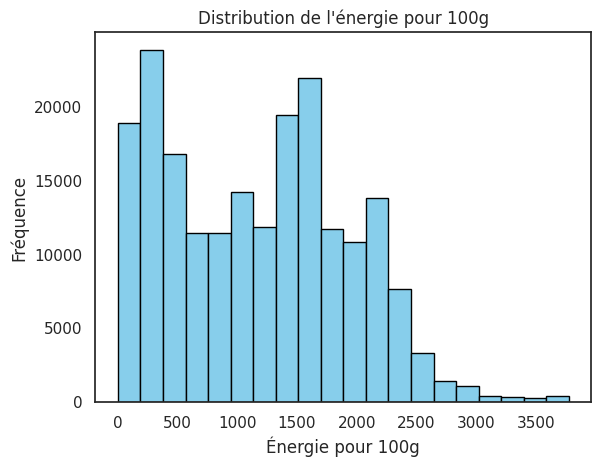

In [187]:

plt.hist(filtered_data['energy_100g'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Énergie pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution de l\'énergie pour 100g')
plt.show()

### Boxplot de l'energie pour 100g

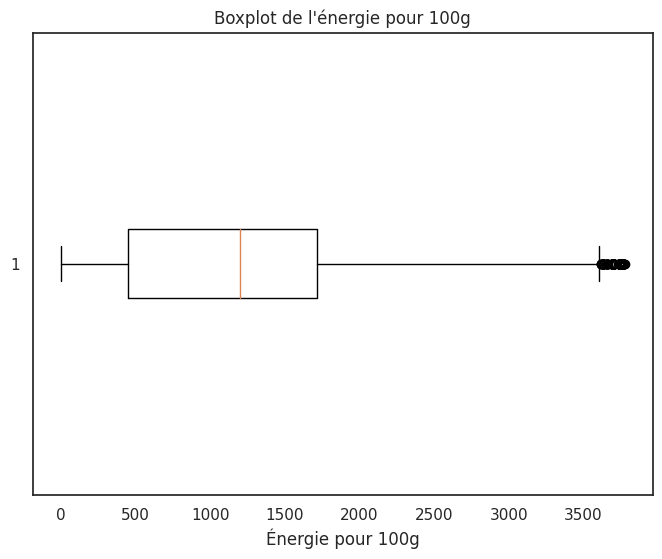

In [188]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['energy_100g'].dropna(), vert=False)
plt.xlabel('Énergie pour 100g')
plt.title('Boxplot de l\'énergie pour 100g')
plt.show()

## Distribution statistique empirique salt_100g

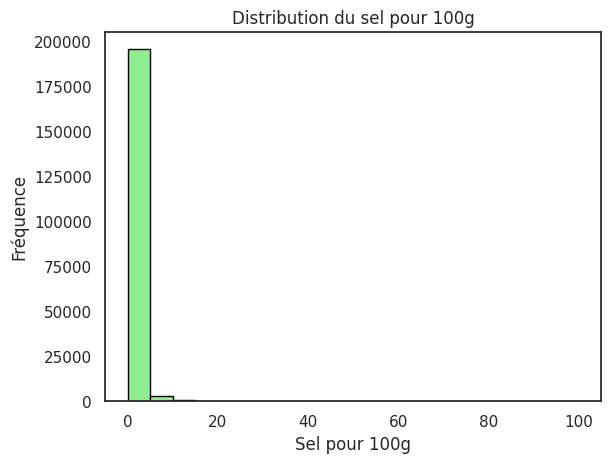

In [189]:
plt.hist(filtered_data['salt_100g'], bins=20, color='lightgreen', edgecolor='black')
plt.xlabel('Sel pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution du sel pour 100g')
plt.show()

### Boxplot du sel pour 100g

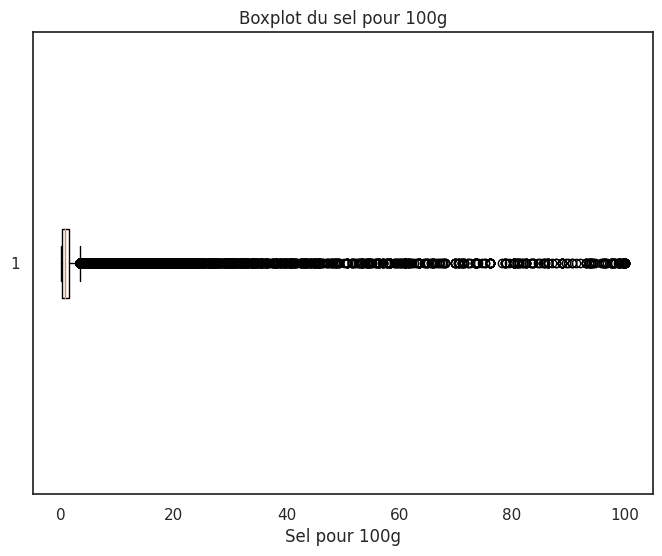

In [190]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['salt_100g'].dropna(), vert=False)
plt.xlabel('Sel pour 100g')
plt.title('Boxplot du sel pour 100g')
plt.show()

## Distribution statistique empirique proteins_100g

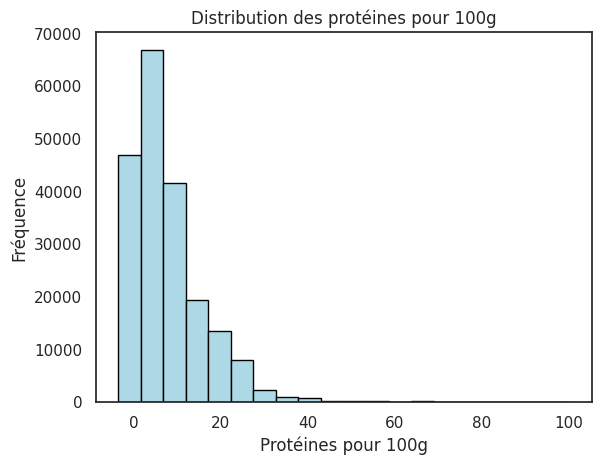

In [191]:
# Histogramme de la colonne 'proteins_100g'
plt.hist(filtered_data['proteins_100g'], bins=20, color='lightblue', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Protéines pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution des protéines pour 100g')

plt.show()

### Boxplot pour les protéines pour 100g

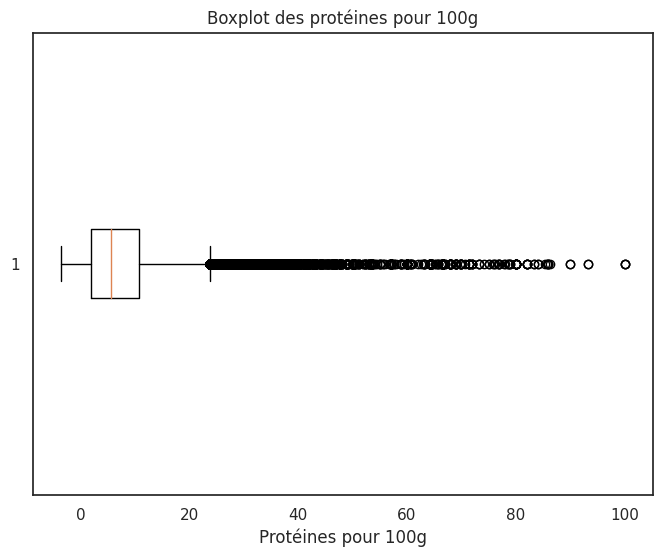

In [192]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['proteins_100g'].dropna(), vert=False)
plt.xlabel('Protéines pour 100g')
plt.title('Boxplot des protéines pour 100g')
plt.show()

## Distribution statistique empirique carbohydrates_100g

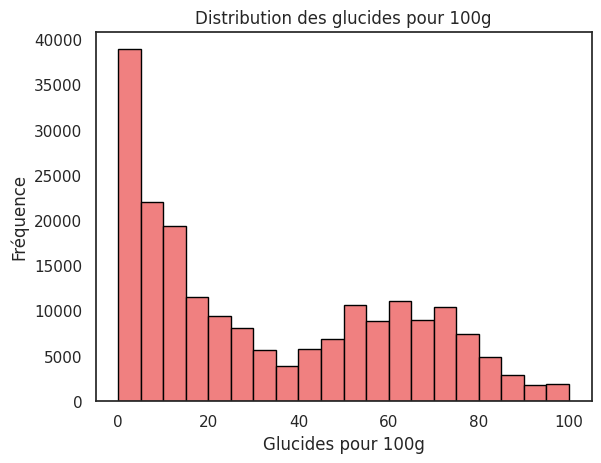

In [193]:
# Histogramme de la colonne 'carbohydrates_100g'
plt.hist(filtered_data['carbohydrates_100g'], bins=20, color='lightcoral', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Glucides pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution des glucides pour 100g')


plt.show()

### Boxplot pour les glucides pour 100g

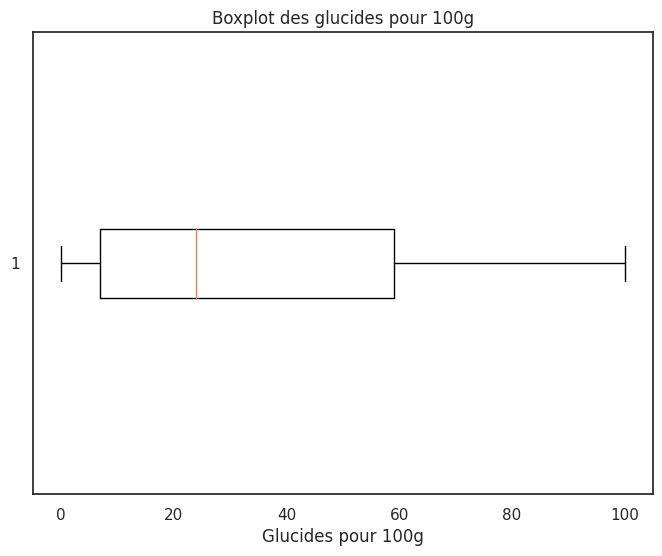

In [194]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['carbohydrates_100g'].dropna(), vert=False)
plt.xlabel('Glucides pour 100g')
plt.title('Boxplot des glucides pour 100g')
plt.show()

## Distribution statistique empirique sugars_100g

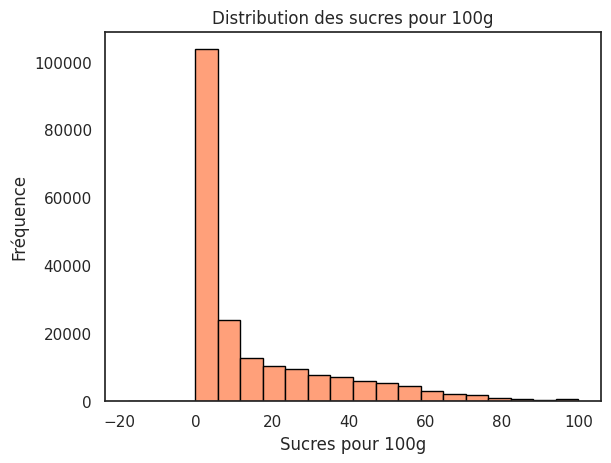

In [195]:
# Histogramme de la colonne 'sugars_100g'
plt.hist(filtered_data['sugars_100g'], bins=20, color='lightsalmon', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Sucres pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution des sucres pour 100g')

plt.show()

### Boxplot pour les sucres pour 100g

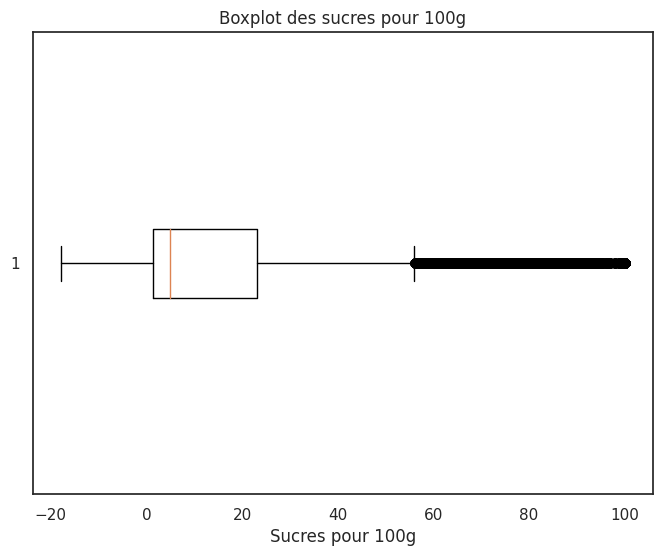

In [196]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['sugars_100g'].dropna(), vert=False)
plt.xlabel('Sucres pour 100g')
plt.title('Boxplot des sucres pour 100g')
plt.show()

## Distribution statistique empirique saturated-fat_100g

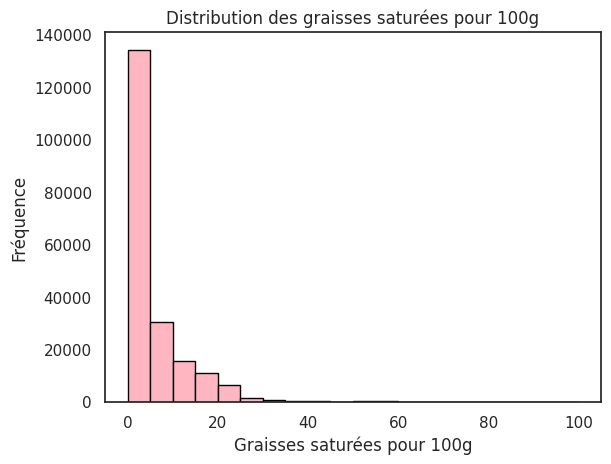

In [197]:
# Histogramme de la colonne 'saturated-fat_100g'
plt.hist(filtered_data['saturated-fat_100g'], bins=20, color='lightpink', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Graisses saturées pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution des graisses saturées pour 100g')

plt.show()

### Boxplot pour les graisses saturées pour 100g

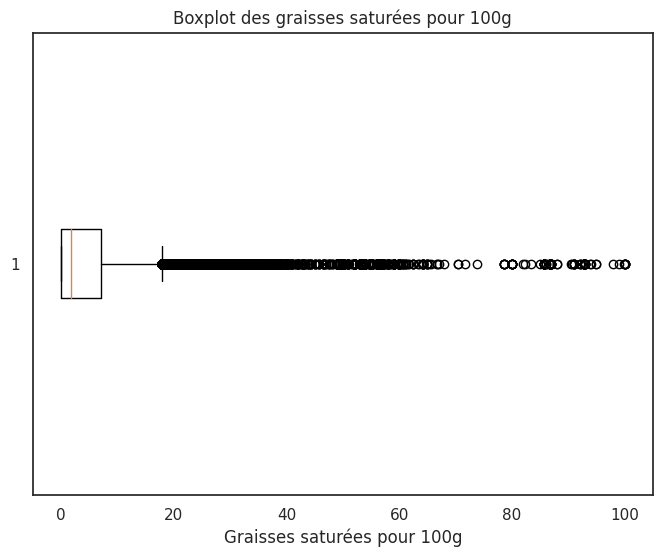

In [198]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['saturated-fat_100g'].dropna(), vert=False)
plt.xlabel('Graisses saturées pour 100g')
plt.title('Boxplot des graisses saturées pour 100g')
plt.show()

## Distribution statistique empirique fat_100g

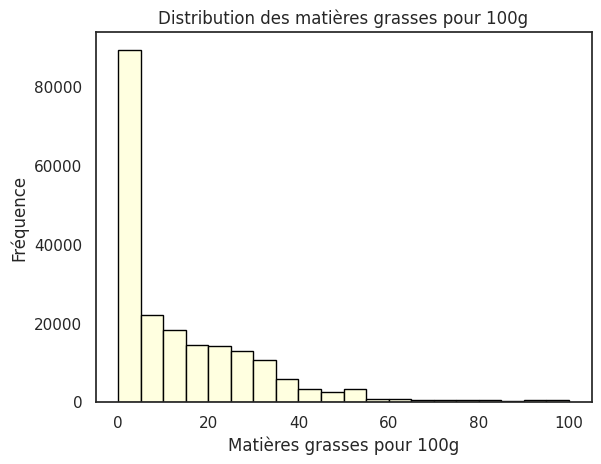

In [199]:
# Histogramme de la colonne 'fat_100g'
plt.hist(filtered_data['fat_100g'], bins=20, color='lightyellow', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Matières grasses pour 100g')
plt.ylabel('Fréquence')
plt.title('Distribution des matières grasses pour 100g')

plt.show()

### Boxplot pour les matières grasses pour 100g

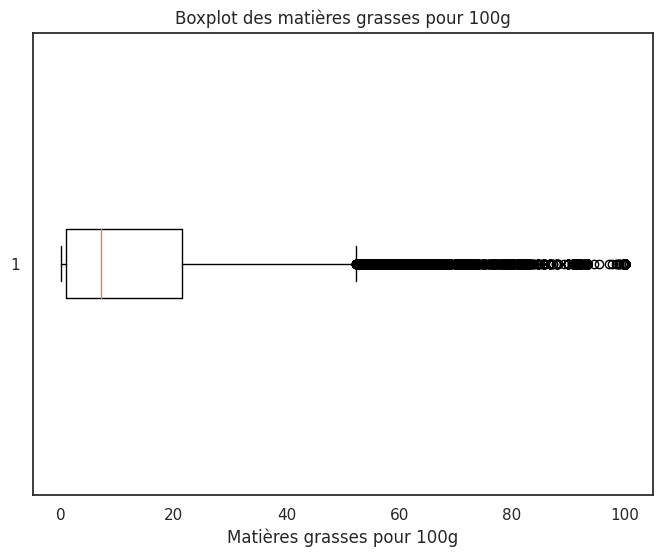

In [200]:
plt.figure(figsize=(8, 6))
plt.boxplot(filtered_data['fat_100g'].dropna(), vert=False)
plt.xlabel('Matières grasses pour 100g')
plt.title('Boxplot des matières grasses pour 100g')
plt.show()

## Distribution statistique empirique pnns_groups_1

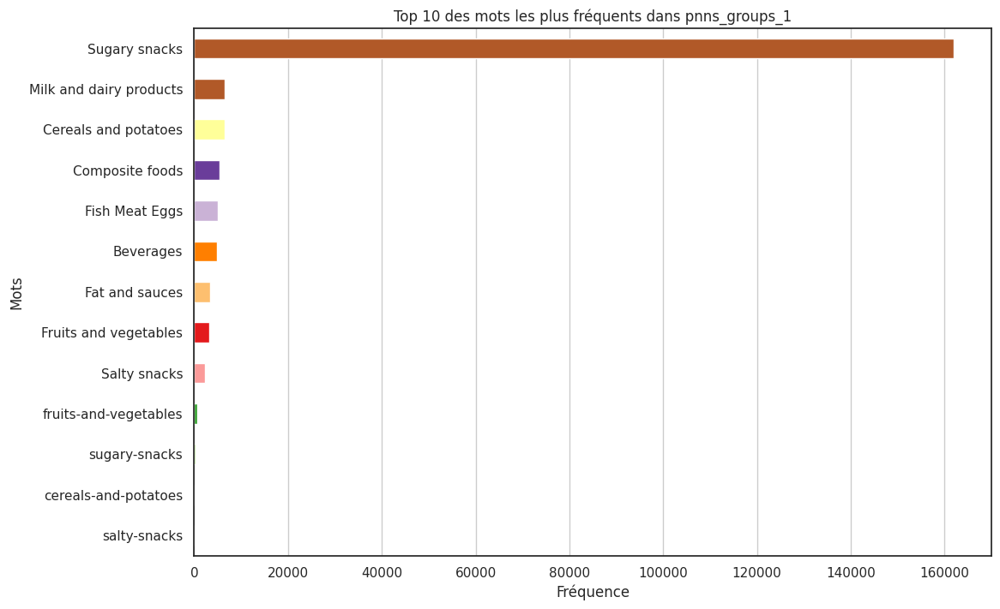

In [201]:
# Compter les occurrences des mots dans la colonne 'pnns_groups_1'
word_counts = filtered_data['pnns_groups_1'].value_counts().head(20)

# Trier les résultats de façon décroissante
word_counts = word_counts.sort_values(ascending=True)

# Générer une liste de couleurs pour le graphique
colors = plt.cm.Paired(range(len(word_counts)))

# Générer le graphique en barres horizontales
plt.figure(figsize=(12, 8))
word_counts.plot(kind='barh', color=colors)
plt.title('Top 10 des mots les plus fréquents dans pnns_groups_1')
plt.xlabel('Fréquence')
plt.ylabel('Mots')
plt.grid(axis='x')

plt.show()

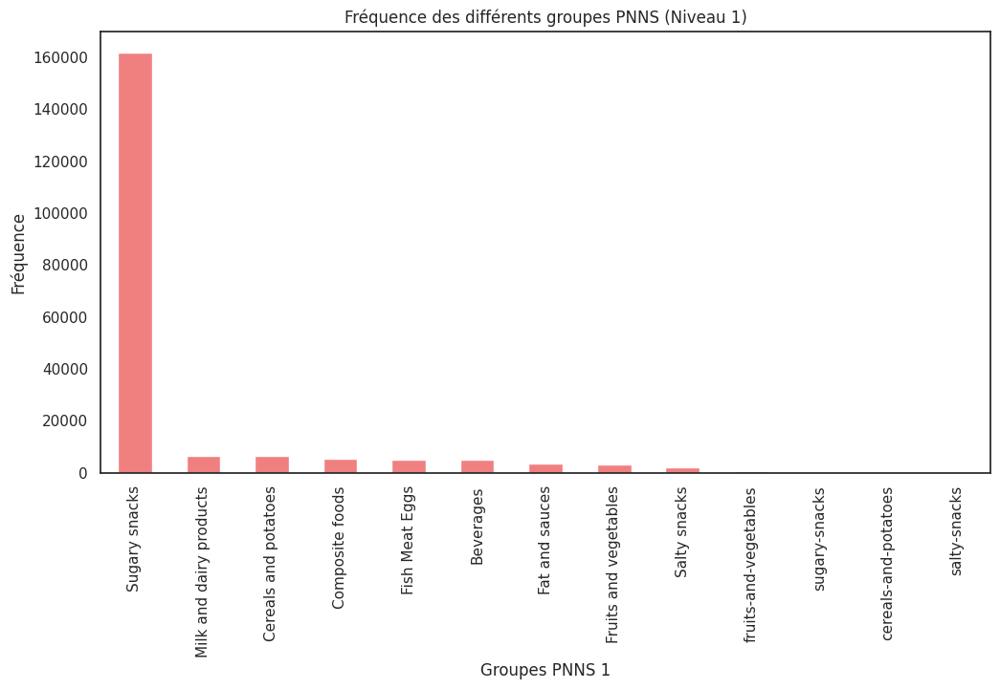

In [202]:
plt.figure(figsize=(12, 6))
filtered_data['pnns_groups_1'].value_counts().plot(kind='bar', color='lightcoral')
plt.xlabel('Groupes PNNS 1')
plt.ylabel('Fréquence')
plt.title('Fréquence des différents groupes PNNS (Niveau 1)')
plt.show()

*Remplacer sugary-snacks par Sugary snacks dans pnns_groups_1*

In [203]:
# Remplacement des valeurs dans la colonne pnns_groups_1

filtered_data['pnns_groups_1'] = filtered_data['pnns_groups_1'].replace(
    {'sugary-snacks': 'Sugary snacks',
    'fruits-and-vegetables': 'fruits and vegetables',
     'cereals-and-potatoes': 'Cereals and potatoes',
     'salty-snacks': 'Salty snacks'})


In [204]:
filtered_data['pnns_groups_1'].value_counts()

Sugary snacks              162317
Milk and dairy products      6523
Cereals and potatoes         6491
Composite foods              5421
Fish Meat Eggs               5127
Beverages                    4944
Fat and sauces               3465
Fruits and vegetables        3298
Salty snacks                 2255
fruits and vegetables         666
Name: pnns_groups_1, dtype: int64

## Distribution statistique empirique pnns_groups_2

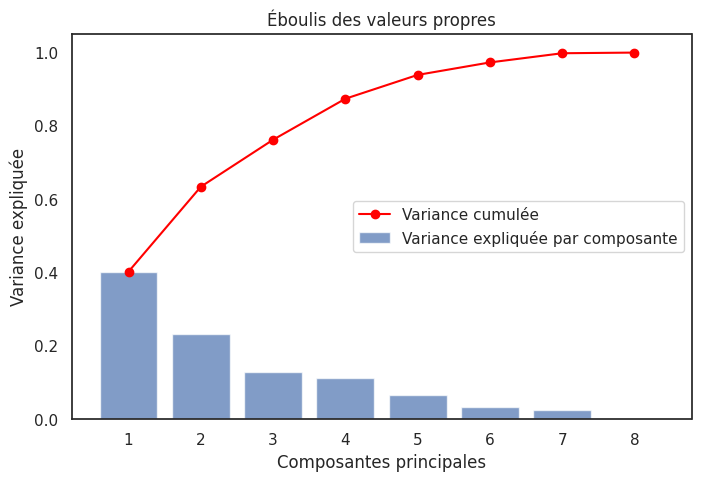

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


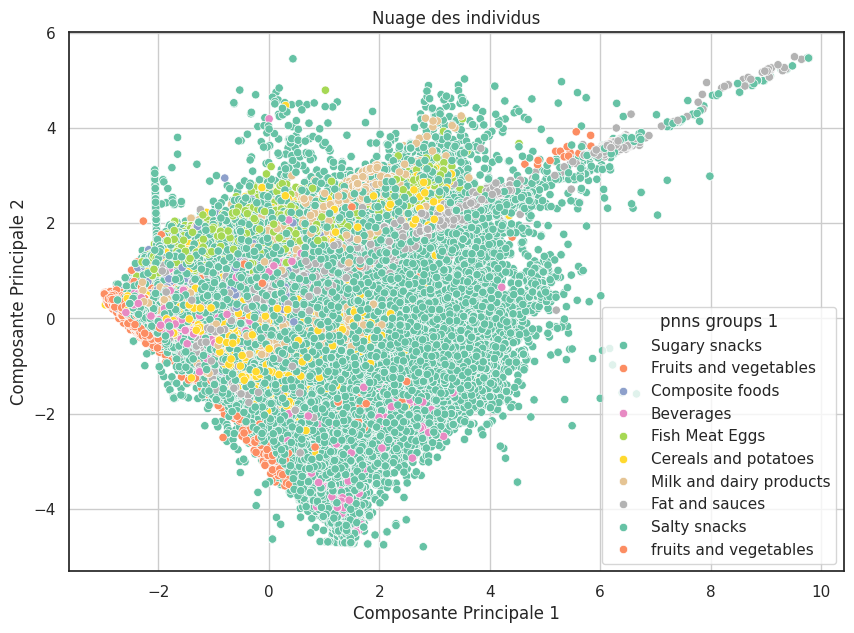

In [205]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Copier les données filtrées
data_filtre_copy = filtered_data.copy()

# Filtrer les colonnes numériques
numeric_columns = filtered_data.select_dtypes(include=['float64', 'int64']).dropna(axis=1).columns
data_numeric = filtered_data[numeric_columns].dropna()

# Normaliser les données
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data_numeric)

# Appliquer l'ACP
pca = PCA()
principal_components = pca.fit_transform(data_normalized)

# Créer un DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(principal_components.shape[1])])

# Ajouter la colonne des groupes (par exemple 'nutrition_grade_fr') pour colorer les points
pca_df['pnns_groups_1'] = filtered_data['pnns_groups_1'].dropna().reset_index(drop=True)

# Éboulis des valeurs propres (scree plot)
valeurs_propres = pca.explained_variance_ratio_

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(valeurs_propres) + 1), valeurs_propres, alpha=0.7, align='center', label='Variance expliquée par composante')
plt.plot(range(1, len(valeurs_propres) + 1), np.cumsum(valeurs_propres), marker='o', color='red', label='Variance cumulée')
plt.xlabel('Composantes principales')
plt.ylabel('Variance expliquée')
plt.title('Éboulis des valeurs propres')
plt.legend()
plt.show()

# Reprendre uniquement les deux premières composantes pour le nuage des individus
pca_df_2d = pca_df[['PC1', 'PC2', 'pnns_groups_1']]

# Nuage des individus
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='pnns_groups_1', data=pca_df_2d, palette='Set2')
plt.title('Nuage des individus')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.legend(title='pnns groups 1')
plt.grid(True)
plt.show()

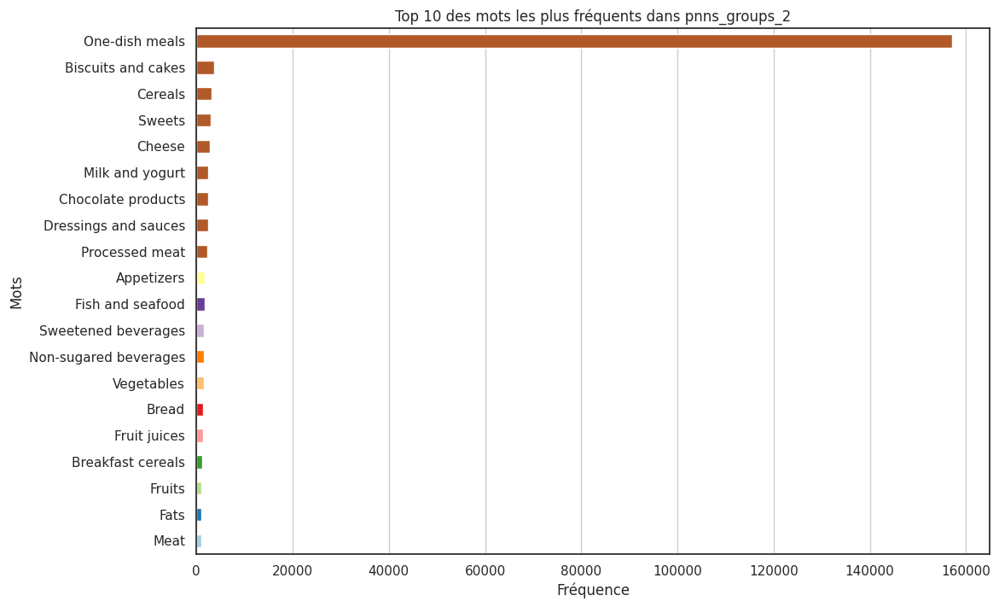

In [206]:
# Compter les occurrences des mots dans la colonne 'pnns_groups_2'
word_counts = filtered_data['pnns_groups_2'].value_counts().head(20)

# Trier les résultats de façon décroissante
word_counts = word_counts.sort_values(ascending=True)

# Générer une liste de couleurs pour le graphique
colors = plt.cm.Paired(range(len(word_counts)))

# Générer le graphique en barres horizontales
plt.figure(figsize=(12, 8))
word_counts.plot(kind='barh', color=colors)
plt.title('Top 10 des mots les plus fréquents dans pnns_groups_2')
plt.xlabel('Fréquence')
plt.ylabel('Mots')
plt.grid(axis='x')

plt.show()

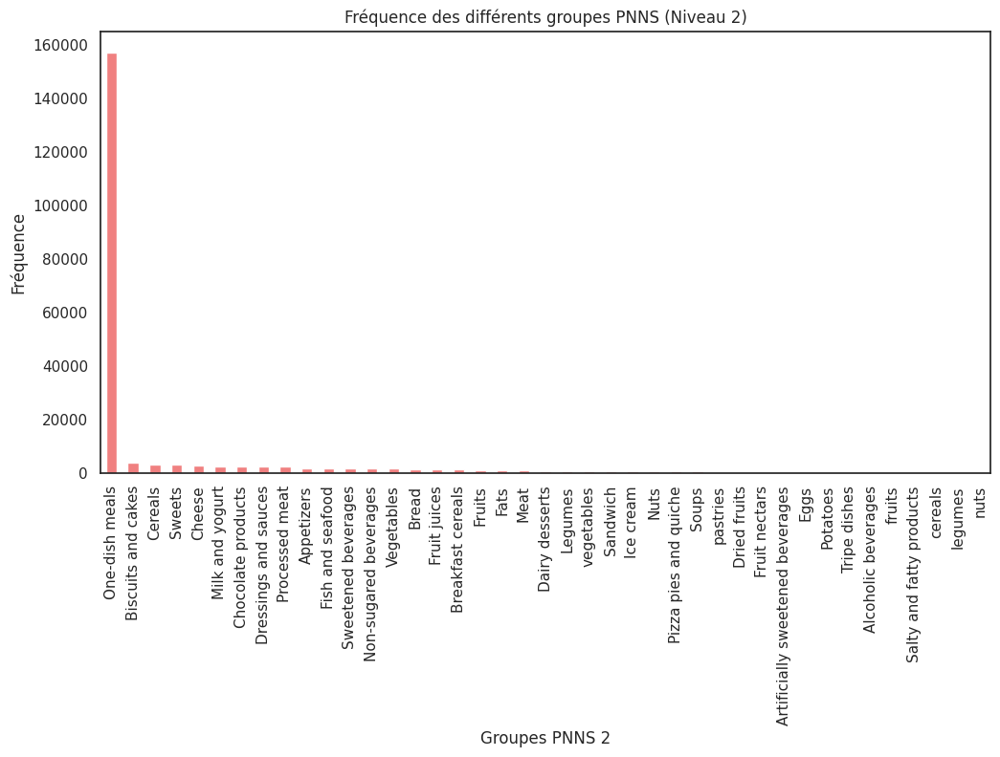

In [207]:
plt.figure(figsize=(12, 6))
filtered_data['pnns_groups_2'].value_counts().plot(kind='bar', color='lightcoral')
plt.xlabel('Groupes PNNS 2')
plt.ylabel('Fréquence')
plt.title('Fréquence des différents groupes PNNS (Niveau 2)')
plt.show()

In [208]:

# Obtenir les 10 produits les plus courants par pnns_groups_2
top_10_pnns2 = filtered_data['pnns_groups_2'].value_counts().head(10)
top_10_pnns2

One-dish meals          157094
Biscuits and cakes        3710
Cereals                   3171
Sweets                    3008
Cheese                    2775
Milk and yogurt           2483
Chocolate products        2420
Dressings and sauces      2398
Processed meat            2319
Appetizers                1755
Name: pnns_groups_2, dtype: int64

## Distribution statistique empirique countries_fr

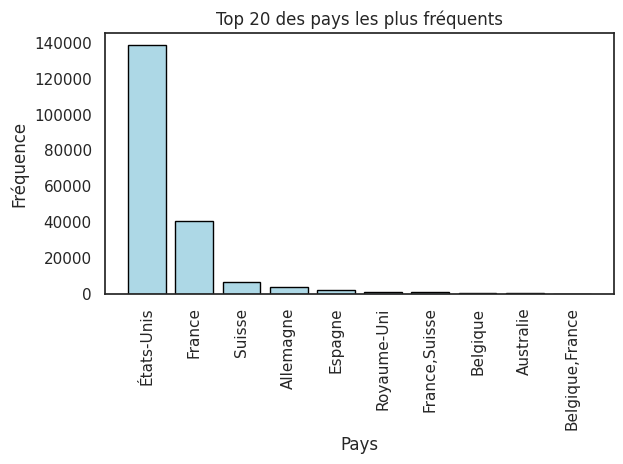

In [209]:
# Compter les occurrences des pays et sélectionner les 20 premiers
top_countries = filtered_data['countries_fr'].value_counts().head(10)

# Créer l'histogramme des 20 pays les plus fréquents
plt.bar(top_countries.index, top_countries.values, color='lightblue', edgecolor='black')

# Ajout des étiquettes et du titre
plt.xlabel('Pays')
plt.ylabel('Fréquence')
plt.title('Top 20 des pays les plus fréquents')

# Ajustement des étiquettes sur l'axe des x pour éviter la surcharge
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

# Analyse bivariées

## heatmap de correlation

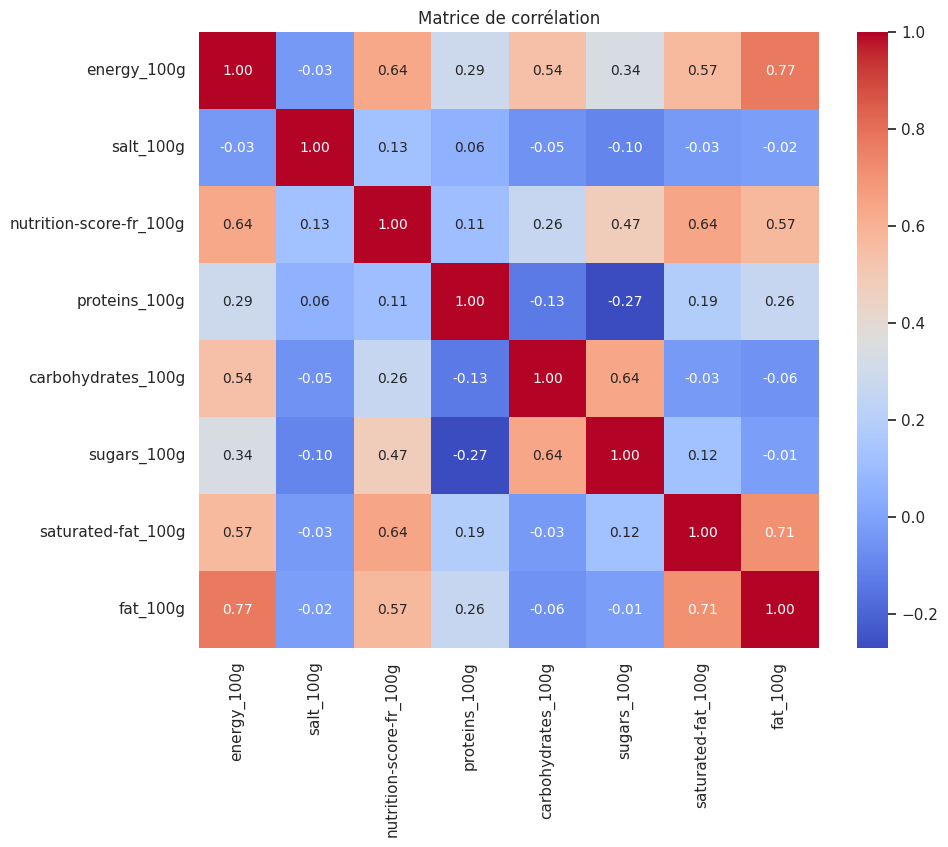

In [210]:
# Sélection des variables numériques pertinentes
numeric_columns = ['energy_100g', 'salt_100g', 'nutrition-score-fr_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g', 'saturated-fat_100g', 'fat_100g']

# Calcul de la matrice de corrélation
corr_matrix = filtered_data[numeric_columns].corr()

# Visualisation avec heatmap de seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={"size": 10})
plt.title('Matrice de corrélation')
plt.show()

## Relation nutrition_grade_fr et nutrition-score-fr_100g

*visualiser la répartition des scores nutritionnels selon les différents grades nutritionnels. Cela peut nous aider à identifier s'il y a des différences marquées dans la distribution des scores nutritionnels entre les différents grades*

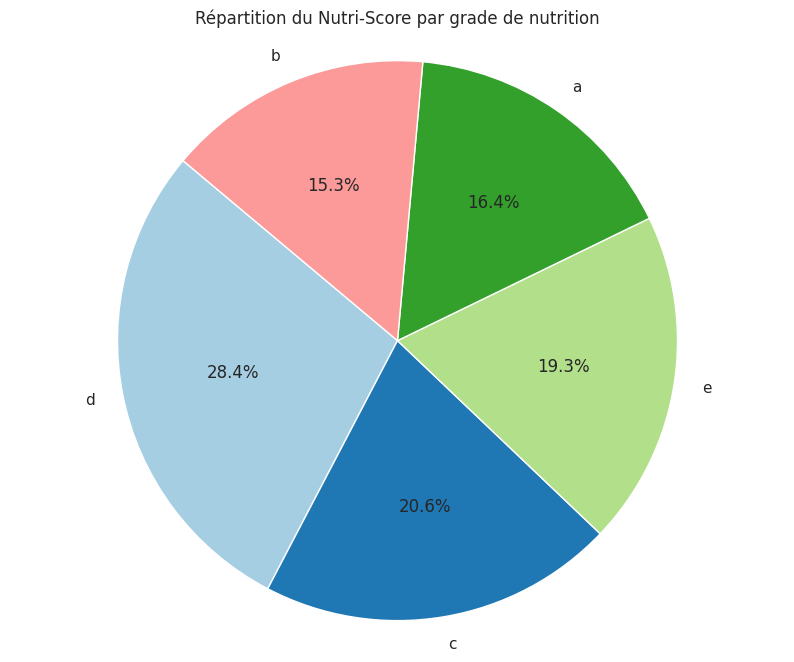

In [211]:
# Calculer la répartition des grades de nutrition
grade_counts = filtered_data['nutrition_grade_fr'].value_counts()

# Générer le diagramme circulaire
plt.figure(figsize=(10, 8))
grade_counts.plot(kind='pie', autopct='%1.1f%%', colors=plt.cm.Paired(range(len(grade_counts))), startangle=140)
plt.title('Répartition du Nutri-Score par grade de nutrition')
plt.ylabel('')  
plt.axis('equal')  

# Afficher le graphique
plt.show()

<Figure size 1200x800 with 0 Axes>

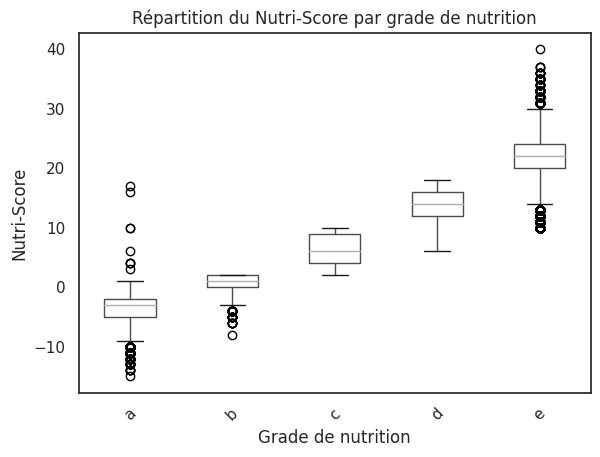

In [212]:
# Générer le boxplot
plt.figure(figsize=(12, 8))
filtered_data.boxplot(column='nutrition-score-fr_100g', by='nutrition_grade_fr', grid=False)
plt.title('Répartition du Nutri-Score par grade de nutrition')
plt.suptitle('')  # Supprimer le titre par défaut généré par pandas
plt.xlabel('Grade de nutrition')
plt.ylabel('Nutri-Score')
plt.xticks(rotation=45)

# Afficher le graphique
plt.show()

## Relation entre le score et l'energie

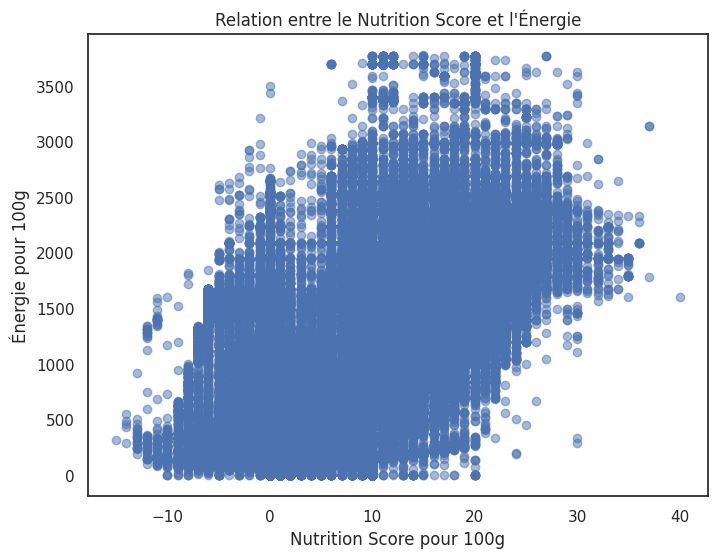

In [213]:
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['nutrition-score-fr_100g'], filtered_data['energy_100g'], alpha=0.5)
plt.xlabel('Nutrition Score pour 100g')
plt.ylabel('Énergie pour 100g')
plt.title('Relation entre le Nutrition Score et l\'Énergie')
plt.show()

## Relation entre matiere grasse et energie

*Les matières grasses et l'énergie sont deux aspects importants de la composition nutritionnelle des aliments. Comparer ces deux variables peut aider à comprendre comment la quantité de matières grasses dans un aliment influence son contenu énergétique.*

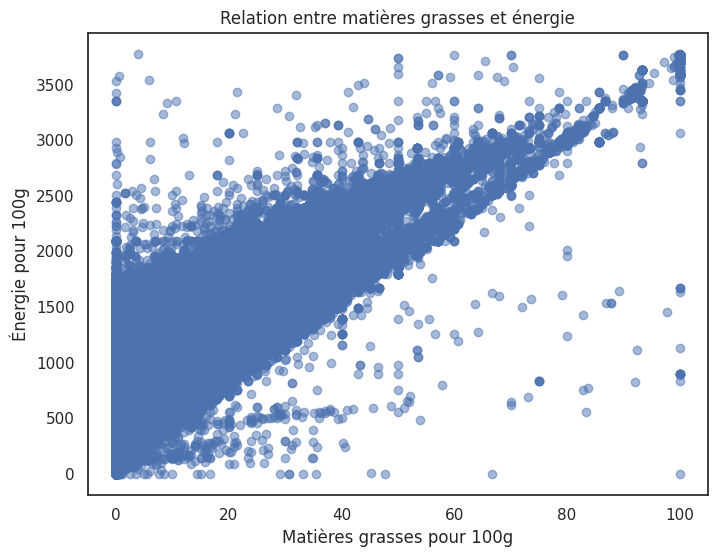

In [214]:
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['fat_100g'], filtered_data['energy_100g'], alpha=0.5)
plt.xlabel('Matières grasses pour 100g')
plt.ylabel('Énergie pour 100g')
plt.title('Relation entre matières grasses et énergie')
plt.show()

## Analyse de régression de fat_100g et energy_100g pour prédire

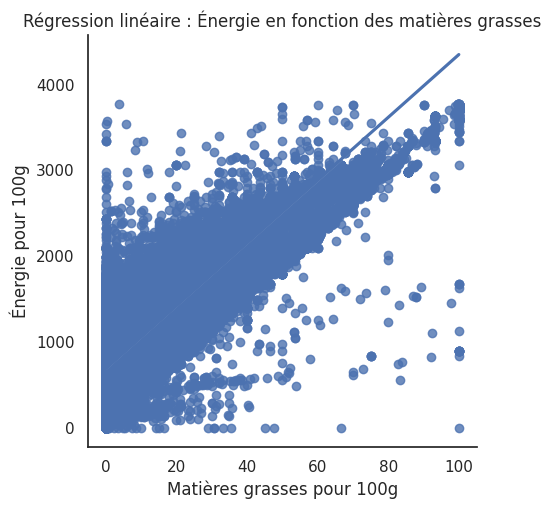

In [215]:
sns.lmplot(x='fat_100g', y='energy_100g', data=filtered_data)
plt.xlabel('Matières grasses pour 100g')
plt.ylabel('Énergie pour 100g')
plt.title('Régression linéaire : Énergie en fonction des matières grasses')
plt.show()

### jointplot entre energy_100g' et fat_100g

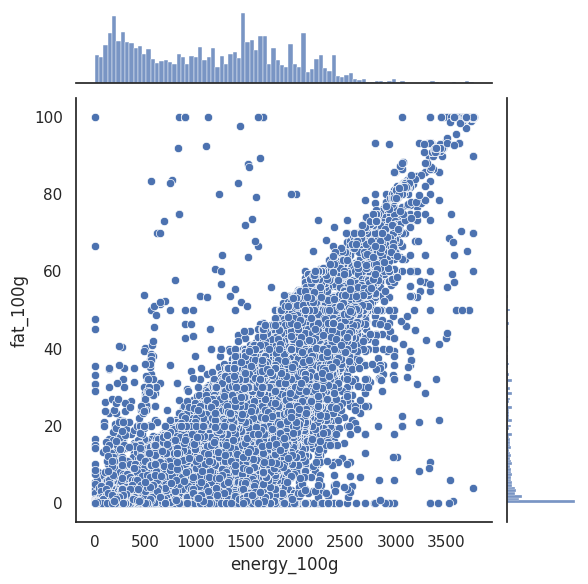

In [216]:
# Exemple de jointplot pour visualiser la relation entre energy_100g et fat_100g
sns.jointplot(data=filtered_data, x='energy_100g', y='fat_100g', kind='scatter')

# Affichage du plot
plt.show()

## Analyse de la relation entre énergie et proteine

*Comparer ces deux variables peut aider à comprendre comment la quantité de protéines dans un aliment influence sa teneur en énergie*

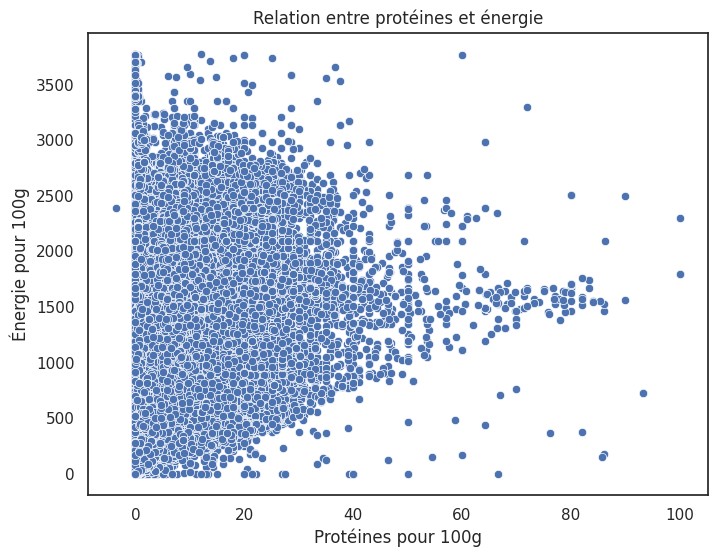

In [217]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='proteins_100g', y='energy_100g', data=filtered_data)
plt.xlabel('Protéines pour 100g')
plt.ylabel('Énergie pour 100g')
plt.title('Relation entre protéines et énergie')
plt.show()

## Relation nutrition_grade_fr et proteins_100g

*évaluer si la teneur en protéines varie significativement en fonction du grade attribué*

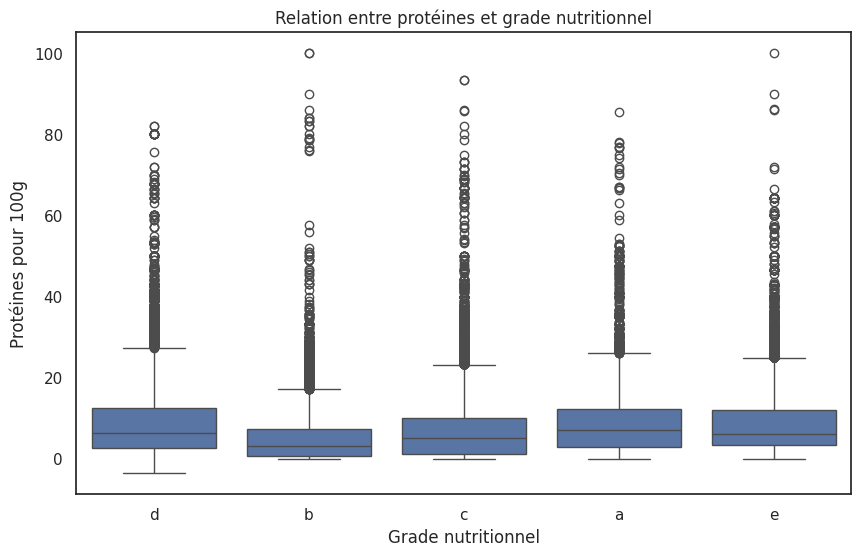

In [218]:
# Créer un boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='nutrition_grade_fr', y='proteins_100g', data=filtered_data)
plt.xlabel('Grade nutritionnel')
plt.ylabel('Protéines pour 100g')
plt.title('Relation entre protéines et grade nutritionnel')
plt.show()

## relation entre saturated-fat_100g et fat_100g

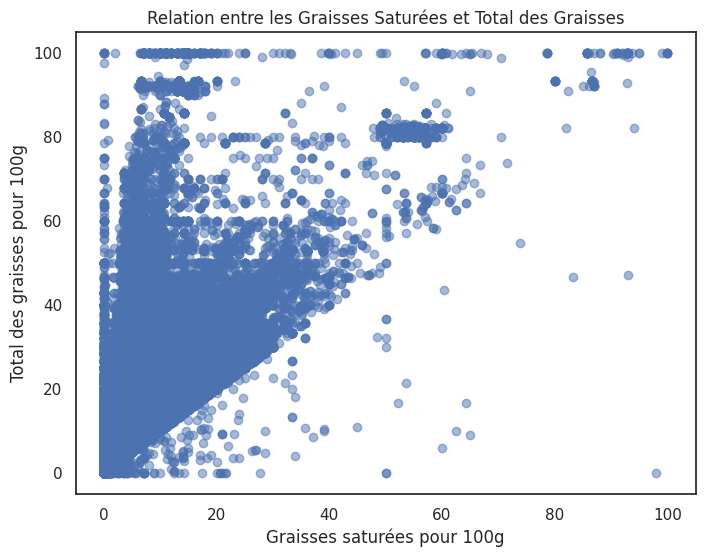

In [219]:
# Plot the relationship between saturated fat and total fat without regression
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['saturated-fat_100g'], filtered_data['fat_100g'], alpha=0.5)
plt.xlabel('Graisses saturées pour 100g')
plt.ylabel('Total des graisses pour 100g')
plt.title('Relation entre les Graisses Saturées et Total des Graisses')
plt.show()

## Relation entre les glucides et sucre

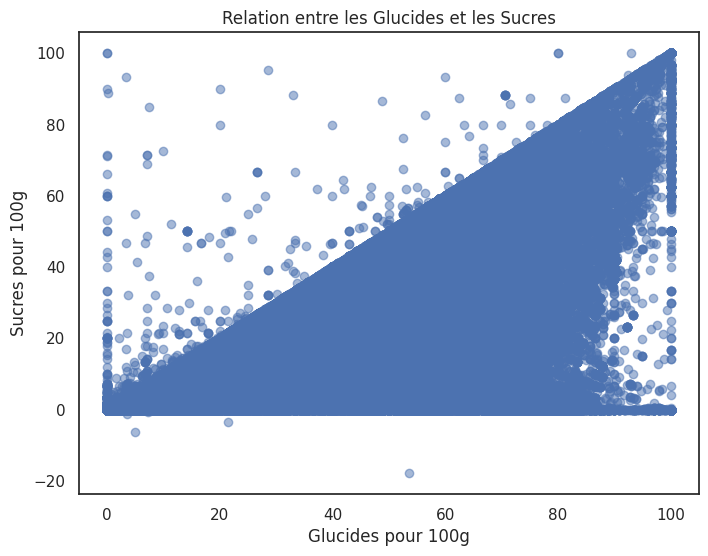

In [220]:
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['carbohydrates_100g'], filtered_data['sugars_100g'], alpha=0.5)
plt.xlabel('Glucides pour 100g')
plt.ylabel('Sucres pour 100g')
plt.title('Relation entre les Glucides et les Sucres')
plt.show()

## comparer les protéines par groupe PNNS_1

*Le groupe PNNS 1 est une classification des aliments basée sur leur composition nutritionnelle et leurs effets sur la santé, utilisée notamment en France. En comparant la teneur en protéines à travers ces groupes, nous pouvons identifier les différences dans la quantité de protéines entre les catégories d'aliments définies par le PNNS*

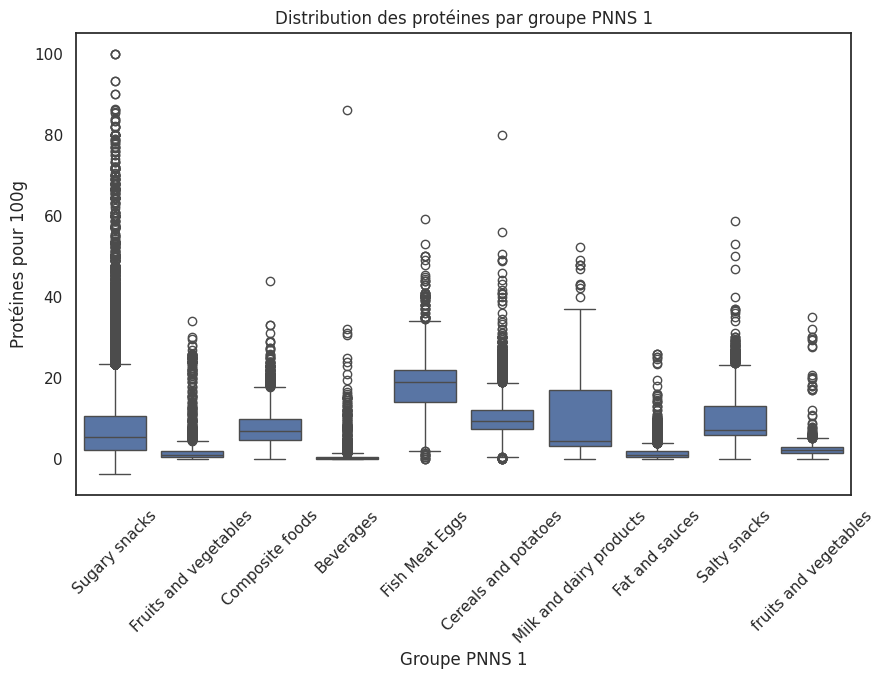

In [221]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='pnns_groups_1', y='proteins_100g', data=filtered_data)
plt.xlabel('Groupe PNNS 1')
plt.ylabel('Protéines pour 100g')
plt.title('Distribution des protéines par groupe PNNS 1')
plt.xticks(rotation=45)
plt.show()

## comparer les protéines par groupe PNNS_2

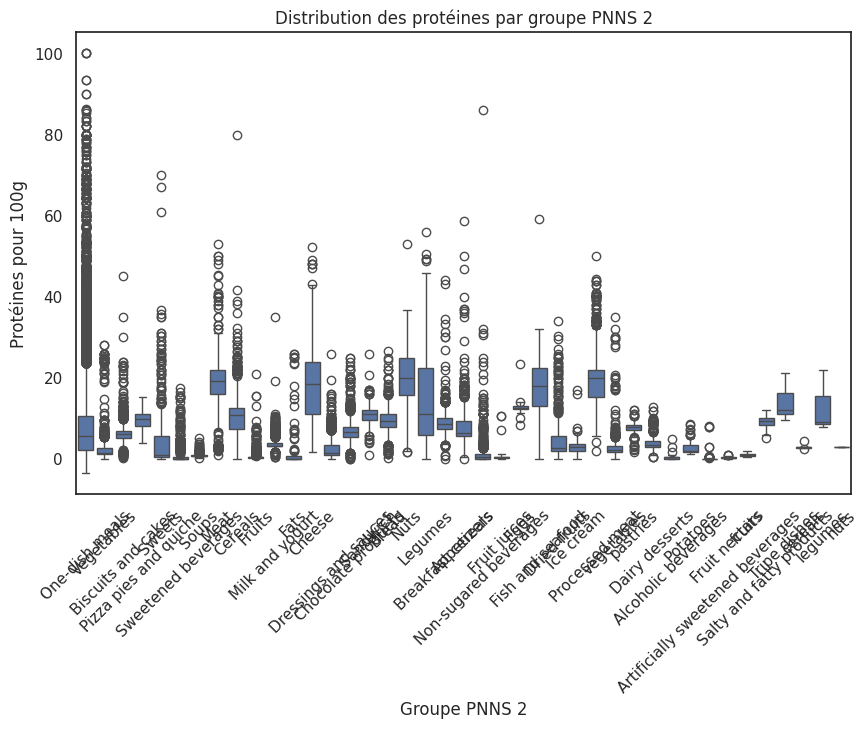

In [222]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='pnns_groups_2', y='proteins_100g', data=filtered_data)
plt.xlabel('Groupe PNNS 2')
plt.ylabel('Protéines pour 100g')
plt.title('Distribution des protéines par groupe PNNS 2')
plt.xticks(rotation=45)
plt.show()

## comparer les protéines par grade nutritionnel

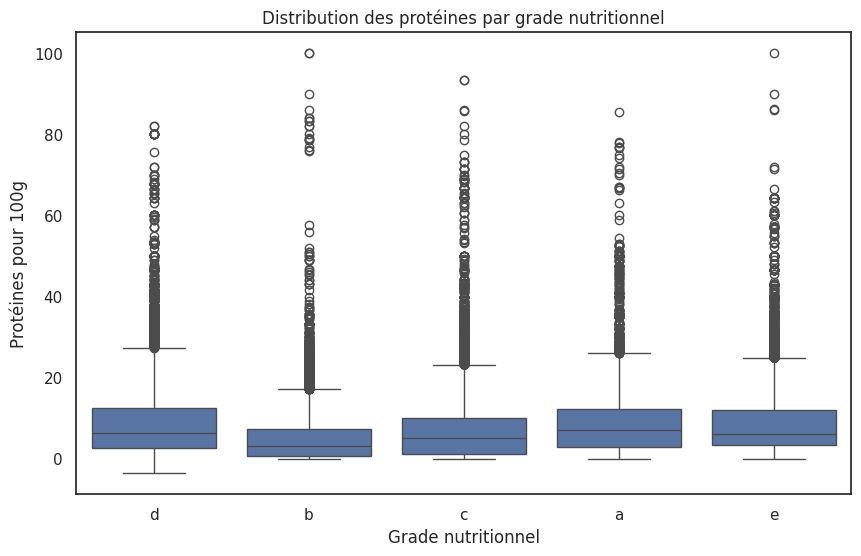

In [223]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='nutrition_grade_fr', y='proteins_100g', data=filtered_data)
plt.xlabel('Grade nutritionnel')
plt.ylabel('Protéines pour 100g')
plt.title('Distribution des protéines par grade nutritionnel')
plt.show()

## Relation entre nutrition_grade_fr et la matiere gras

*Les matières grasses sont un élément important de la composition nutritionnelle des aliments. En comparant la quantité de matières grasses à travers différents grades nutritionnels, nous pouvons évaluer comment la teneur en matières grasses varie en fonction de la qualité nutritionnelle perçue des aliments*

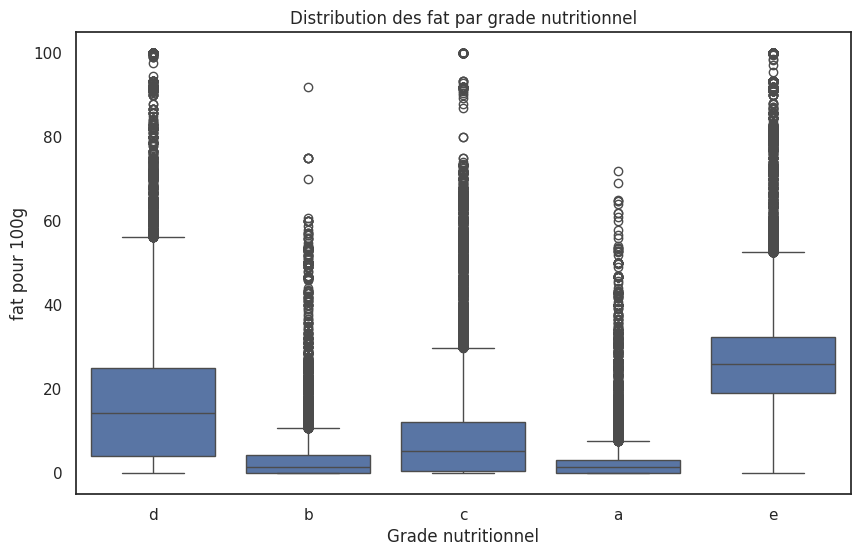

In [224]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='nutrition_grade_fr', y='fat_100g', data=filtered_data)
plt.xlabel('Grade nutritionnel')
plt.ylabel('fat pour 100g')
plt.title('Distribution des fat par grade nutritionnel')
plt.show()

## Relation entre le salt_100g et nutrition-score-fr_100g

*Le sel est un élément important à surveiller dans l'alimentation en raison de son impact sur la santé, notamment en relation avec des problèmes comme l'hypertension. En comparant le score nutritionnel à la quantité de sel, nous pouvons examiner comment la teneur en sel d'un aliment influence son évaluation nutritionnelle globale.*

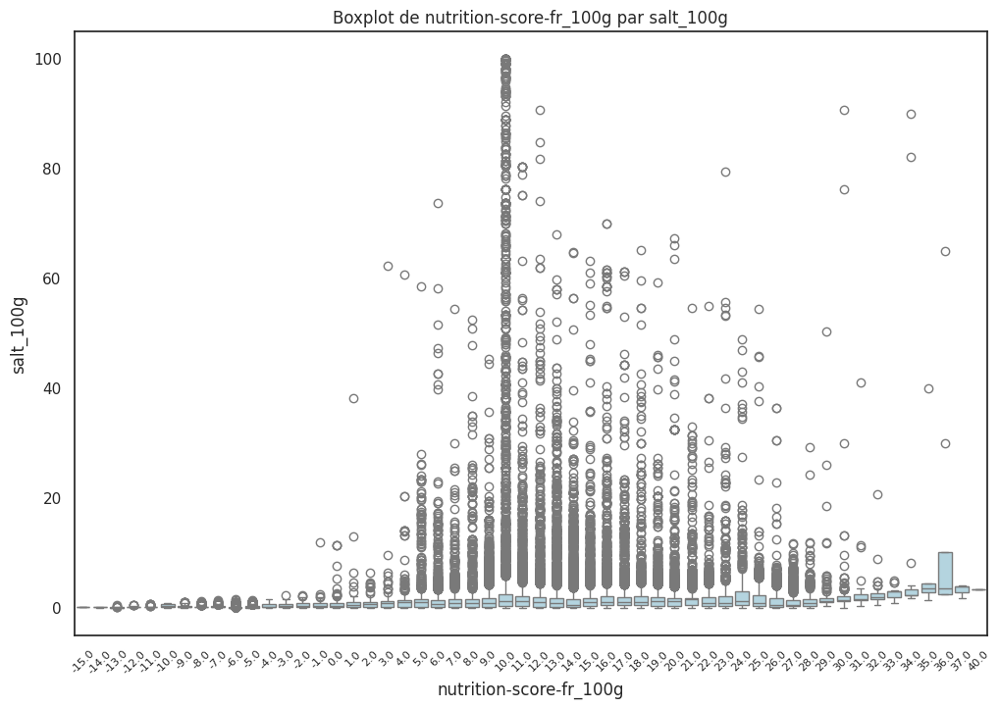

In [225]:
# Création du boxplot avec Seaborn
plt.figure(figsize=(12, 8))
sns.boxplot(data=filtered_data, y='salt_100g', x='nutrition-score-fr_100g', color='lightblue')
plt.title('Boxplot de nutrition-score-fr_100g par salt_100g')
plt.xlabel('nutrition-score-fr_100g')
plt.ylabel('salt_100g')

# Ajustement des étiquettes de l'axe des abscisses
plt.xticks(rotation=45, fontsize=8)

plt.show()

## Relation entre le sel et proteine

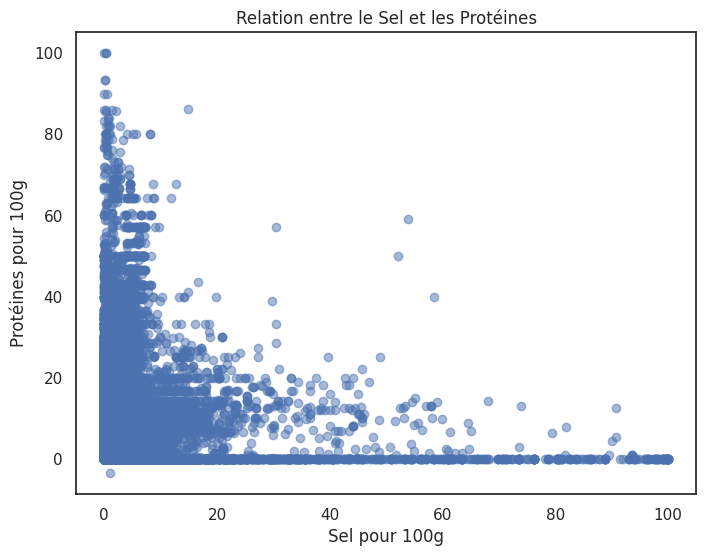

In [226]:
# Plot the relationship between salt and proteins without regression
plt.figure(figsize=(8, 6))
plt.scatter(filtered_data['salt_100g'], filtered_data['proteins_100g'], alpha=0.5)
plt.xlabel('Sel pour 100g')
plt.ylabel('Protéines pour 100g')
plt.title('Relation entre le Sel et les Protéines')
plt.show()

In [227]:
# Calcul du coefficient de corrélation entre 'nutrition-score-fr_100g' et 'salt_100g'
correlation = filtered_data['nutrition-score-fr_100g'].corr(data_filtre['salt_100g'])
print(f"Coefficient de corrélation : {correlation}")

Coefficient de corrélation : 0.12566518520218767


Cela indique une corrélation positive assez faible entre ces deux variables dans notre jeu de données.

## Pairplot bivariée de nutrition-score-fr_100g, saturated-fat_100g et nutrition_grade_fr

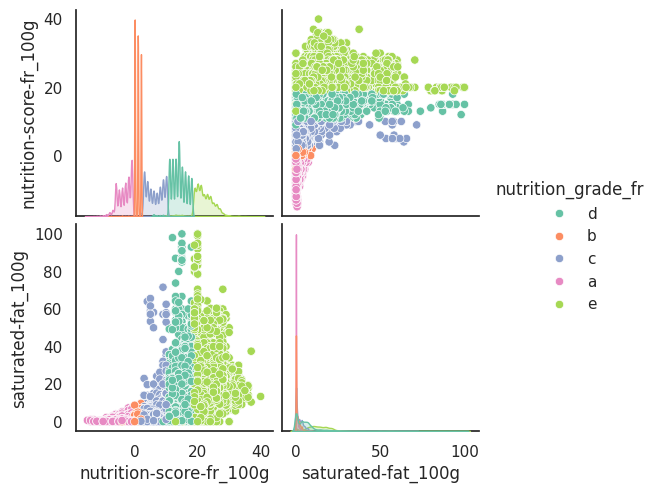

In [228]:
# Filtrer le DataFrame pour inclure uniquement les colonnes d'intérêt
data_subset = filtered_data[['nutrition-score-fr_100g', 'saturated-fat_100g', 'nutrition_grade_fr']].dropna()

# Créer un pairplot avec seaborn
sns.pairplot(data_subset, hue='nutrition_grade_fr', palette='Set2')

# Afficher le plot
plt.show()

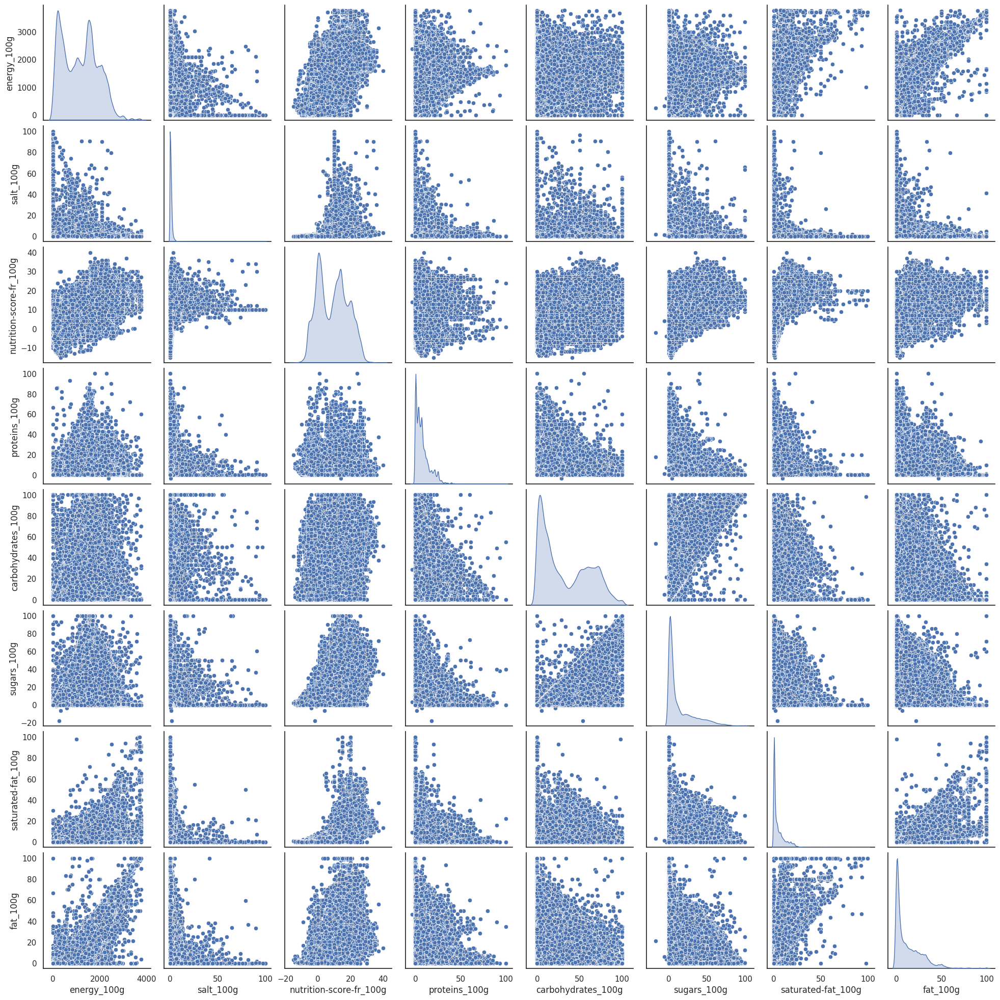

In [229]:
# Pairplot pour visualiser les relations entre les variables
sns.pairplot(filtered_data[['energy_100g', 'salt_100g', 'nutrition-score-fr_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g', 'saturated-fat_100g', 'fat_100g']], diag_kind='kde')
plt.show()

# Analyses multivariées

Pour répondre à cette exigence, nous devons effectuer les étapes suivantes :

* Sélection de variables pertinentes : Identifier et sélectionner les variables les plus pertinentes pour l'analyse multivariée.
* Création de nouvelles variables : Créer des variables dérivées qui pourraient être utiles pour l'analyse.
* Analyse multivariée : Utiliser des techniques comme la régression linéaire, l'analyse en composantes principales (ACP), ou d'autres méthodes pour examiner les relations entre les variables.
* Tests statistiques : Effectuer des tests statistiques appropriés pour vérifier la significativité des résultats.

## Correlation des variables categoritielles

'Matrice de corrélation catégorielle:'

,nutrition_grade_fr,countries_fr,pnns_groups_1,pnns_groups_2
nutrition_grade_fr,1.000000,0.058027,0.395157,0.510791
countries_fr,0.058027,1.000000,0.115902,0.106056
pnns_groups_1,0.395157,0.115902,1.000000,1.000000
pnns_groups_2,0.510791,0.106056,1.000000,1.000000


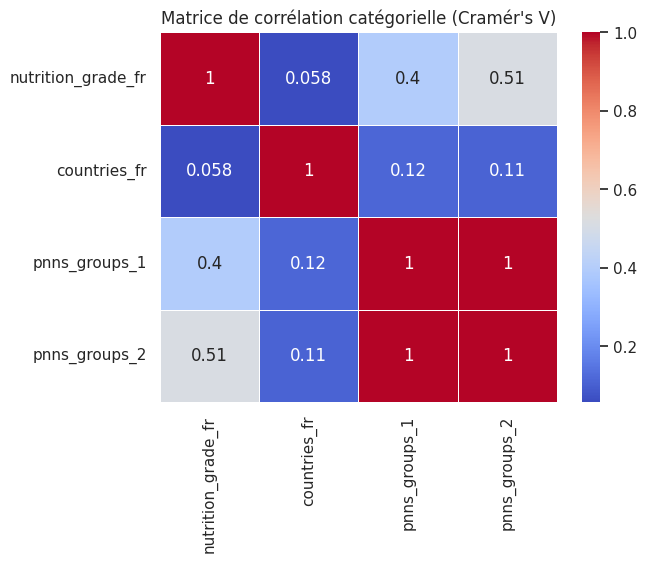

In [230]:
import scipy.stats as stats
# Fonction pour calculer le coefficient de Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = stats.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

filtered_data = filtered_data.copy()

# Conversion des colonnes catégorielles en type 'category'
filtered_data['nutrition_grade_fr'] = data_filtre['nutrition_grade_fr'].astype('category')
filtered_data['countries_fr'] = data_filtre['countries_fr'].astype('category')
filtered_data['pnns_groups_1'] = data_filtre['pnns_groups_1'].astype('category')
filtered_data['pnns_groups_2'] = data_filtre['pnns_groups_2'].astype('category')

# Sélection des colonnes catégorielles
cat_columns = ['nutrition_grade_fr', 'countries_fr', 'pnns_groups_1', 'pnns_groups_2']

# Calcul de la matrice de corrélation pour les variables catégorielles
corr_matrix = pd.DataFrame(index=cat_columns, columns=cat_columns)

for col1 in cat_columns:
    for col2 in cat_columns:
        corr_matrix.loc[col1, col2] = cramers_v(data_filtre[col1], data_filtre[col2])

# Convertir les valeurs en float pour la visualisation
corr_matrix = corr_matrix.astype(float)

# Afficher la matrice de corrélation
display("Matrice de corrélation catégorielle:")
display(corr_matrix)

# Visualiser la matrice de corrélation avec un heatmap de seaborn
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Matrice de corrélation catégorielle (Cramér\'s V)')
plt.show()

## Nuage des individus

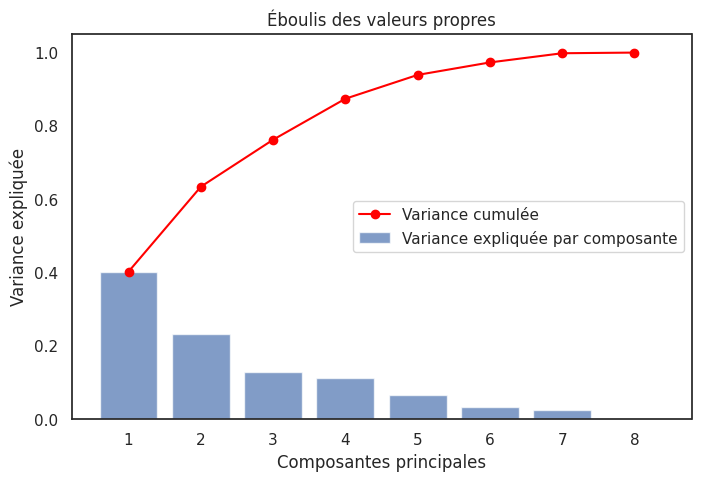

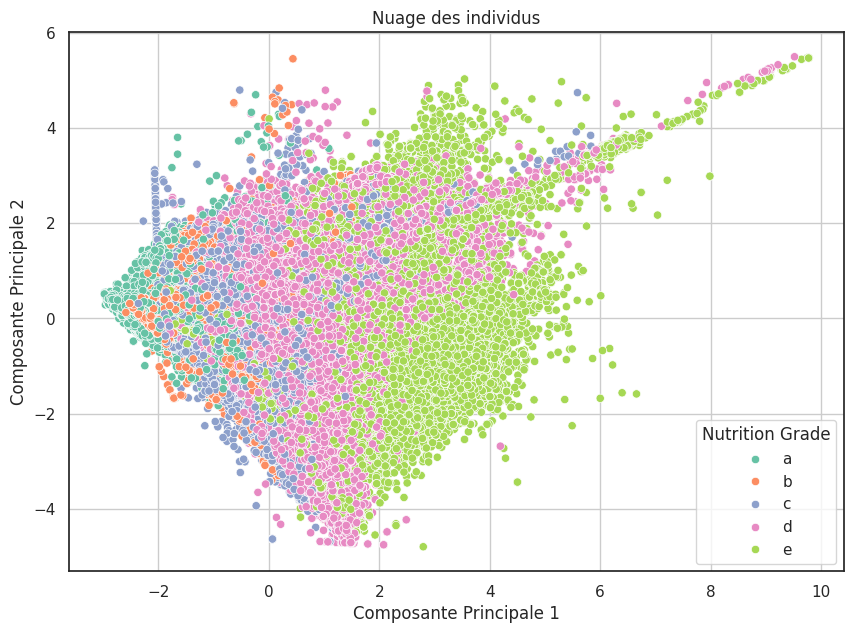

In [231]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Copier les données filtrées
data_filtre_copy = filtered_data.copy()

# Filtrer les colonnes numériques
numeric_columns = filtered_data.select_dtypes(include=['float64', 'int64']).dropna(axis=1).columns
data_numeric = filtered_data[numeric_columns].dropna()

# Normaliser les données
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data_numeric)

# Appliquer l'ACP
pca = PCA()
principal_components = pca.fit_transform(data_normalized)

# Créer un DataFrame avec les composantes principales
pca_df = pd.DataFrame(data=principal_components, columns=[f'PC{i+1}' for i in range(principal_components.shape[1])])

# Ajouter la colonne des groupes (par exemple 'nutrition_grade_fr') pour colorer les points
pca_df['nutrition_grade_fr'] = filtered_data['nutrition_grade_fr'].dropna().reset_index(drop=True)

# Éboulis des valeurs propres (scree plot)
valeurs_propres = pca.explained_variance_ratio_

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(valeurs_propres) + 1), valeurs_propres, alpha=0.7, align='center', label='Variance expliquée par composante')
plt.plot(range(1, len(valeurs_propres) + 1), np.cumsum(valeurs_propres), marker='o', color='red', label='Variance cumulée')
plt.xlabel('Composantes principales')
plt.ylabel('Variance expliquée')
plt.title('Éboulis des valeurs propres')
plt.legend()
plt.show()

# Reprendre uniquement les deux premières composantes pour le nuage des individus
pca_df_2d = pca_df[['PC1', 'PC2', 'nutrition_grade_fr']]

# Nuage des individus
plt.figure(figsize=(10, 7))
sns.scatterplot(x='PC1', y='PC2', hue='nutrition_grade_fr', data=pca_df_2d, palette='Set2')
plt.title('Nuage des individus')
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.legend(title='Nutrition Grade')
plt.grid(True)
plt.show()

## Cercle de correlation

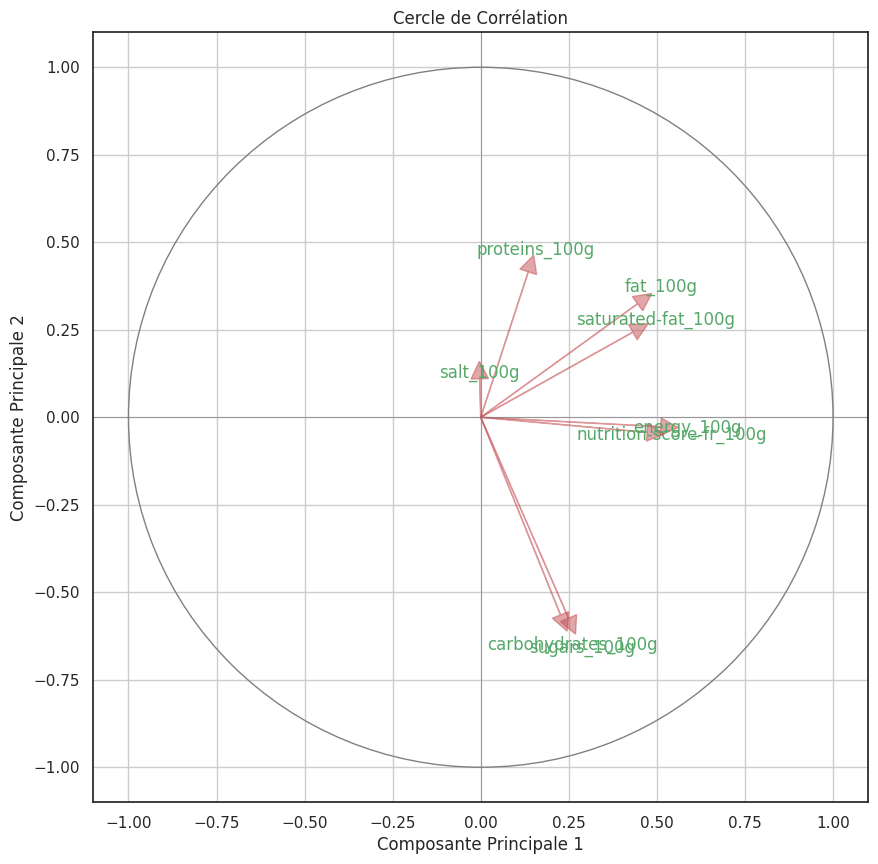

In [232]:
from sklearn.preprocessing import StandardScaler

# Sélectionner les colonnes numériques pour l'analyse de corrélation
colonnes_numeriques = ['energy_100g', 'salt_100g', 'nutrition-score-fr_100g',
                       'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
                       'saturated-fat_100g', 'fat_100g']

# Standardiser les données
scaler = StandardScaler()
donnees_standardisees = scaler.fit_transform(filtered_data[colonnes_numeriques].dropna())

# Calculer la matrice de corrélation
matrice_correlation = np.corrcoef(donnees_standardisees, rowvar=False)

# Effectuer la décomposition en valeurs propres
valeurs_propres, vecteurs_propres = np.linalg.eig(matrice_correlation)

# Sélectionner les deux vecteurs propres correspondant aux plus grandes valeurs propres
pc1 = vecteurs_propres[:, 0]
pc2 = vecteurs_propres[:, 1]

# Créer une nouvelle figure
plt.figure(figsize=(10, 10))

# Tracer le cercle
cercle = plt.Circle((0, 0), 1, color='gray', fill=False)
plt.gca().add_artist(cercle)

# Tracer les flèches
for i, variable in enumerate(colonnes_numeriques):
    plt.arrow(0, 0, pc1[i], pc2[i], color='r', alpha=0.5, head_width=0.05, head_length=0.05)
    plt.text(pc1[i] * 1.15, pc2[i] * 1.15, variable, color='g', ha='center', va='center')

# Ajouter les étiquettes et le titre
plt.xlabel('Composante Principale 1')
plt.ylabel('Composante Principale 2')
plt.title('Cercle de Corrélation')

# Définir les limites du graphique
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)

# Afficher le graphique
plt.grid()
plt.axhline(0, color='grey', lw=0.5)
plt.axvline(0, color='grey', lw=0.5)
plt.show()

## Régression linéaire multiple

In [233]:
# Sélectionner les colonnes de prédicteurs
predictors = ['energy_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g', 'saturated-fat_100g']
X = filtered_data[predictors]
y = filtered_data['proteins_100g']

# Effectuer la régression linéaire multiple
regression_results = pg.linear_regression(X, y)

# Afficher les résultats
display(regression_results)

,names,coef,se,T,pval,r2,adj_r2,CI[2.5%],CI[97.5%]
0,Intercept,3.055057,0.024019,127.191003,0.000000,0.530811,0.5308,3.007979,3.102134
1,energy_100g,0.028381,0.000070,403.752986,0.000000,0.530811,0.5308,0.028244,0.028519
2,fat_100g,-0.959875,0.002842,-337.750236,0.000000,0.530811,0.5308,-0.965446,-0.954305
3,carbohydrates_100g,-0.444985,0.001306,-340.796608,0.000000,0.530811,0.5308,-0.447544,-0.442426
4,sugars_100g,-0.078503,0.000842,-93.227057,0.000000,0.530811,0.5308,-0.080154,-0.076853
5,saturated-fat_100g,0.008496,0.002471,3.438618,0.000585,0.530811,0.5308,0.003653,0.013338


# Rapport d’exploration

salt_100g <= 100

  nutrition-score-fr_100g <= 100

 carbohydrates_100g <= 100

  sugars_100g <= 100

  energy_100g <= 3800

 proteins_100g <= 100

saturated-fat_100g <= 100

  fat_100g <= 100



le nombre de produit ayant travailler  : 320749 produit

les produit filtrer provenant de la France

Imputation par mode effectuer et median


Taille des données  808.17 Mo




# Respect du RGPD

Notre projet respecte les principes du RGPD en garantissant la transparence totale sur la collecte et l'utilisation des données, même sans inclure de données personnelles. Nous appliquons des mesures strictes de sécurité des données pour préserver leur intégrité et leur confidentialité. La minimisation des données est assurée par une collecte limitée aux informations essentielles pour atteindre nos objectifs de santé publique. Nous favorisons la précision des données en mettant en place des processus de gestion rigoureux. Enfin, nous offrons des mécanismes clairs pour que les utilisateurs puissent exercer leurs droits d'accès, de rectification et de suppression des données, garantissant ainsi une conformité totale avec les normes RGPD

# Conclusion

Ce projet vise à améliorer la base de données Open Food Facts pour Santé publique France en développant un système de suggestion ou d'auto-complétion pour réduire les erreurs de saisie et les valeurs manquantes.

Il représente une étape cruciale vers l'amélioration de la qualité des données nutritionnelles disponibles, tout en répondant aux exigences strictes de protection des données et en assurant la conformité avec les normes RGPD